# Проект: Исследовательский анализ данных в Python и проверка гипотез данных Яндекс.Афиша

## Введение

- Автор: Новикова Мария Федоровна
- Дата: 28.07.2025 г.

### Цели и задачи проекта

<font> **Цели проекта:**
-выявление инсайтов об изменении пользовательских предпочтений и популярности событий осенью 2024 года, а также проверка гипотезы о разнице в поведении пользователей с мобильными и стационарными устройствами.</font>

<font> **Задачи проекта:**
- ознакомление с данными;
- проверка корректности данных, в том числе приведение предобработки, получение необходимого среза данных;
- проведение исследовательского анализа;
- проведение статистических тестов;
- обоснование выбранного типа t-теста и уровня статистической значимости.
- приведение результатов теста, или p-value.
- вывод на основе полученного p-value, интерпретация результатов.
- приведение возможных причин, объясняющих полученные результаты
- составление итоговых выводов и результатов по итогам проведенного анализа.</font>

 ### Описание данных


<font>   
    
Датасет  `final_tickets_orders_df.csv` включает информацию обо всех заказах билетов, совершённых с двух типов устройств — мобильных и стационарных.
    
Датасет `final_tickets_events_df.csv` содержит информацию о событиях, включая город и регион события, а также информацию о площадке проведения мероприятия. 
    
    
Дополнительный датасет `final_tickets_tenge_df.csv` с информацией о курсе тенге к российскому рублю за 2024 год. Значения в рублях представлено для 100 тенге. 
</font>


## Содержимое проекта

<font> **Основные шаги проекта:**
    
- Загрузка данных и знакомство с ними
- Предобработка данных
- Исследовательский анализ
- Проверка гипотез
- Итоговые выводы и рекомендации
    .</font>

---


## Шаг 1.  Загрузка данных и знакомство с ними

### 1.1. Вывод общей информации, исправление названия столбцов


In [1]:
# Импортируем библиотеки
import pandas as pd
import numpy as np

# Загружаем библиотеки для визуализации данных
import matplotlib.pyplot as plt
import seaborn as sns 

from statsmodels.stats.power import NormalIndPower
from statsmodels.stats.proportion import proportion_effectsize
from math import ceil
from scipy.stats import ttest_ind
from math import floor
!pip install missingno -q
import missingno as msno

# Загрузим библиотеку для построения диаграммы Венна
try:
    from matplotlib_venn import venn2
except ImportError:
    !pip install matplotlib-venn -q
    from matplotlib_venn import venn2


In [2]:
# добавим фукнцию для подписи значений на график
def autolabel(rects, labels=None, height_factor=1.01):
    for i, rect in enumerate(rects):
        height = rect.get_height()
        if labels is not None:
            try:
                label = labels[i]
            except (TypeError, KeyError):
                label = ' '
        else:
            label = '%.2f' % height
        ax.text(rect.get_x() + rect.get_width()/2., height_factor*height,
                '{}'.format(label),
                ha='center', va='bottom')

In [3]:
# Установим опцию, чтобы выводить на экран все столбцы датафрейм для упрощения анализа.
pd.set_option('display.max_columns', None)

In [4]:
# Выгружаем данные в переменные 
orders_df = pd.read_csv('https://___.net/___/final_tickets_orders_df.csv')

In [5]:
events_df = pd.read_csv('https://___.net/___/final_tickets_events_df.csv')

In [6]:
tenge_df = pd.read_csv('https://___.net/___/final_tickets_tenge_df.csv')    

**Объединим все данные из orders_df и events_df в один датафрейм df**

In [7]:
# Соединяем данные из двух датафреймов "левым" способом, чтобы сохранить все данные
df = orders_df.merge(events_df, how='left', left_on = 'event_id', right_on = 'event_id')

#### **Ознакомление с данными df**

In [8]:
# Выводим 7 случайных строк
df.sample(n=7)

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
70017,521972,3127060e4f02037,2024-08-27,2024-08-27 16:55:54,411264,нет,0,rub,desktop,390.60,Лови билет!,5,5579.96,4.0,a6f0b862-8e2c-46ee-a652-7c3b46f76427,концерт,концерты,№5048,Каменевский регион,Глиногорск,213.0,2704.0,"Летний фестиваль ""Симфония"" Лтд","бул. Боровой, д. 8/1 стр. 43"
247826,5142542,d4f86a2e47f76dc,2024-09-29,2024-09-29 07:27:29,457972,нет,0,rub,mobile,221.83,Восьмёрка,2,1848.58,0.0,994a0141-1686-4427-a53f-dd08d95c70d7,событие,другое,№4721,Светополянский округ,Глиноград,54.0,3282.0,"Площадка для муралов ""Мистерия"" Групп","ш. Папанина, д. 555 стр. 130"
225823,1104756,bee508c11bd8f60,2024-06-15,2024-06-15 15:23:10,354086,нет,18,rub,mobile,323.78,Мой билет,2,2490.64,0.0,a9d09e3a-97ea-4225-ba6d-4934157b88b2,шоу,стендап,№2648,Каменевский регион,Глиногорск,213.0,1266.0,"Этнографический музей ""Птица"" Групп","пер. Моховой, д. 8/4 стр. 9"
91208,4998934,4323bb16e88a4d6,2024-09-21,2024-09-21 13:18:34,513249,нет,12,rub,mobile,886.03,Show_ticket,4,17720.60,2.0,9cc55c15-4375-4129-9979-3129688ba1b4,концерт,концерты,№1383,Речиновская область,Дальнесветск,65.0,3721.0,"Студия графики ""Оттенок"" Инк","ул. Чапаева, д. 8 стр. 1/3"
182964,907817,9530b1b07e4b302,2024-07-03,2024-07-03 11:55:26,484384,нет,18,rub,desktop,655.71,Дом культуры,2,7285.62,1.0,7c075d8c-dac7-40b8-a46e-bdd47a14672d,концерт,концерты,№4077,Каменевский регион,Глиногорск,213.0,2446.0,"Народный ансамбль ""Импульс"" и партнеры","алл. Щербакова, д. 28 стр. 30"
114699,2501048,549a72ac7daba6a,2024-09-19,2024-09-19 19:12:50,546011,нет,16,rub,mobile,303.04,Яблоко,3,3367.14,0.0,fa7ce13f-0c82-4ad2-8a7d-3919164a4586,спектакль,театр,№3603,Светополянский округ,Глиноград,54.0,2557.0,"Климатическая академия ""Лаборатория"" и партнеры","наб. Инженерная, д. 2 стр. 4"
28205,141434,0e6fa925c5f346f,2024-10-02,2024-10-02 00:13:41,317299,нет,12,rub,mobile,1577.80,Край билетов,4,14343.65,0.0,a00e1032-6463-4fdc-a105-fdbb6789b556,мюзикл,театр,№4054,Каменевский регион,Глиногорск,213.0,3032.0,"Научно-культурный центр ""Синтез"" Инкорпорэйтед","ул. Водопроводная, д. 4 стр. 869"


In [9]:
# Выводим информацию о датафрейме
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 290849 entries, 0 to 290848
Data columns (total 24 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   order_id                290849 non-null  int64  
 1   user_id                 290849 non-null  object 
 2   created_dt_msk          290849 non-null  object 
 3   created_ts_msk          290849 non-null  object 
 4   event_id                290849 non-null  int64  
 5   cinema_circuit          290849 non-null  object 
 6   age_limit               290849 non-null  int64  
 7   currency_code           290849 non-null  object 
 8   device_type_canonical   290849 non-null  object 
 9   revenue                 290849 non-null  float64
 10  service_name            290849 non-null  object 
 11  tickets_count           290849 non-null  int64  
 12  total                   290849 non-null  float64
 13  days_since_prev         268909 non-null  float64
 14  event_name          

In [10]:
# Выводим данные о названиях столбцов
df.columns

Index(['order_id', 'user_id', 'created_dt_msk', 'created_ts_msk', 'event_id',
       'cinema_circuit', 'age_limit', 'currency_code', 'device_type_canonical',
       'revenue', 'service_name', 'tickets_count', 'total', 'days_since_prev',
       'event_name', 'event_type_description', 'event_type_main', 'organizers',
       'region_name', 'city_name', 'city_id', 'venue_id', 'venue_name',
       'venue_address'],
      dtype='object')

In [11]:
row_count = df.shape[0]
print(f'В полученном датафрейме {row_count} строк')

В полученном датафрейме 290849 строк


**Ознакомление с данными tenge_df**

In [12]:
tenge_df.head()

,data,nominal,curs,cdx
0,2024-01-10,100,19.9391,kzt
1,2024-01-11,100,19.7255,kzt
2,2024-01-12,100,19.5839,kzt
3,2024-01-13,100,19.4501,kzt
4,2024-01-14,100,19.4501,kzt


In [13]:
tenge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 357 entries, 0 to 356
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   data     357 non-null    object 
 1   nominal  357 non-null    int64  
 2   curs     357 non-null    float64
 3   cdx      357 non-null    object 
dtypes: float64(1), int64(1), object(2)
memory usage: 11.3+ KB


### 1.2 Итоги по шагу 1

1. В рамках данного раздела были загружены необходимые библиотеки для работы с данным и датасеты. При первом взгляде, названия столбцов соответствуют содержанию. Названия столбцов соответствуют стилю snake_case.
2. Для удобства работы с данными основные датасеты orders_df и events_df были объединены в один датафрейм df. Полученный датафрейм содержит 290849 строк. Имеются часть столбцов, содержащих пропуски. 
3. Также был загружен датафрейм tenge_df, содержащий вспомогательную информацию для конвертации валюты. Датафрейм не содержит пустых строк и содержит всего 357 строк.

## Шаг 2.  Предобработка данных и подготовка к исследованию

### 2.1 Проверка данных на пропуски

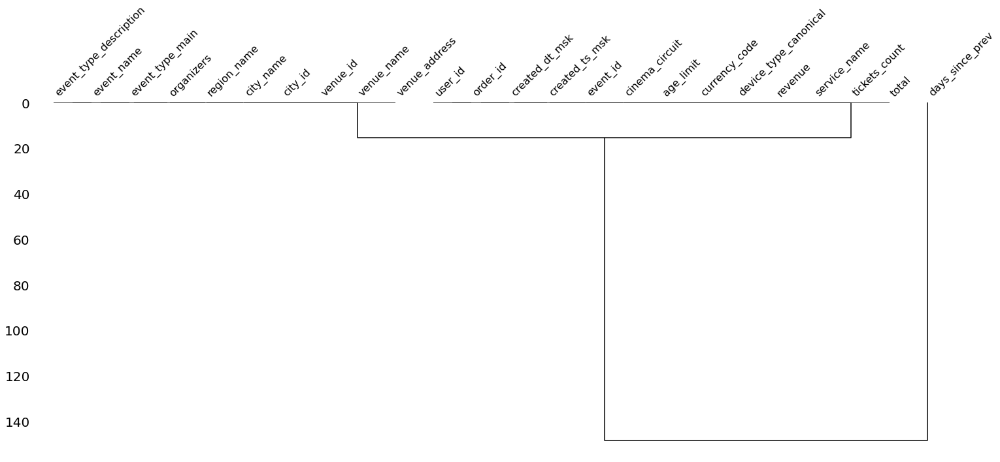

In [14]:
# Метод dendrogram из библиотеки missingno
msno.dendrogram(df)
plt.show()

In [15]:
# Добавляем данные о пропусках в относительных и абсолютных величинах
missing_df = pd.DataFrame({'Кол-во пропусков': df.isnull().sum(), 'Доля пропусков': df.isnull().mean().round(4)})
missing_df

,Кол-во пропусков,Доля пропусков
order_id,0,0.0000
user_id,0,0.0000
created_dt_msk,0,0.0000
created_ts_msk,0,0.0000
event_id,0,0.0000
cinema_circuit,0,0.0000
age_limit,0,0.0000
currency_code,0,0.0000
device_type_canonical,0,0.0000
revenue,0,0.0000


Пропуски выявлены только в 1 столбце из датафрейма `orders_df` : `days_since_prev` (7,54% строк с пропусками), и в столбцах из датафрейма `events_df` имеется 238 незаполненных строк. Это значит, что отсутствуют данные о мероприятиях по 238 покупкам.
Данные не повлияют на дальнейший анализ, поэтому проигнорируем наличие пропусков.

### 2.2 Смена типов данных

In [16]:
# выводим сведения о типах данных
df.dtypes

order_id                    int64
user_id                    object
created_dt_msk             object
created_ts_msk             object
event_id                    int64
cinema_circuit             object
age_limit                   int64
currency_code              object
device_type_canonical      object
revenue                   float64
service_name               object
tickets_count               int64
total                     float64
days_since_prev           float64
event_name                 object
event_type_description     object
event_type_main            object
organizers                 object
region_name                object
city_name                  object
city_id                   float64
venue_id                  float64
venue_name                 object
venue_address              object
dtype: object

Тип данных в большинстве столбцов верный. Необходимо заменить тип данных только в столбце `created_dt_msk` и `created_ts_msk` с `object` на `date`. По столбцам `city_id` `venue_id` необходимо сменить float на int. По столбцам с числовыми данными необходимо понизить разрядность для повышения производительности

In [17]:
# Меняем тип данных на datetime64 в датафрейме df в нескольких столбцах с помощью цикла
for column in ['created_dt_msk', 'created_ts_msk']:
    df[column] = pd.to_datetime(df[column])
    types = df[column].dtypes
    print(f'В столбце {column} датафрейма company_and_rounds_df преобразован тип данных в {types}')

В столбце created_dt_msk датафрейма company_and_rounds_df преобразован тип данных в datetime64[ns]
В столбце created_ts_msk датафрейма company_and_rounds_df преобразован тип данных в datetime64[ns]


In [18]:
# Заменим пропуски в столбце 'days_since_prev', 'city_id', 'venue_id' на индикатор -1 для корректного смена типов данных
columns = ['days_since_prev', 'city_id', 'venue_id']
for column in columns:
    null_before = df[column].isnull().sum()
    df[column] = df[column].fillna(-1)
    null_after = df[column].isnull().sum()
    print(f'В {column} была произведена замена пропусков на заглушки в {(null_before - null_after)} строках, Кол-во пропусков после: {null_after}')

В days_since_prev была произведена замена пропусков на заглушки в 21940 строках, Кол-во пропусков после: 0
В city_id была произведена замена пропусков на заглушки в 238 строках, Кол-во пропусков после: 0
В venue_id была произведена замена пропусков на заглушки в 238 строках, Кол-во пропусков после: 0


In [19]:
# Изменяем тип данных на `int` (в том числе понижаем разрядность). Прописываем цикл для всех столбцов.
columns = ['order_id', 'event_id', 'age_limit', 'tickets_count', 'days_since_prev', 'city_id', 'venue_id']
for column in columns:
    df[column] = pd.to_numeric(df[column], errors='coerce', downcast='integer')
    type_col = df[column].dtypes
    print(f'{column} изменен тип на {type_col}')

order_id изменен тип на int32
event_id изменен тип на int32
age_limit изменен тип на int8
tickets_count изменен тип на int8
days_since_prev изменен тип на int16
city_id изменен тип на int32
venue_id изменен тип на int16


In [20]:
# Меняем тип данных на datetime64 в датафрейме tenge_df
tenge_df['data'] = pd.to_datetime(tenge_df['data'])
type_col = tenge_df['data'].dtypes
print(f'В столбце data изменен тип на {type_col}')

В столбце data изменен тип на datetime64[ns]


In [21]:
# Изменяем тип данных на `int` (в том числе понижаем разрядность).
tenge_df['curs'] = pd.to_numeric(tenge_df['curs'], errors='coerce', downcast='float')
type_col = tenge_df['curs'].dtypes
print(f'В столбце data изменен тип на {type_col}')

В столбце data изменен тип на float32


### 2.3 Нормализация данных. Изучение категориальных значений. Поиск выбросов

In [22]:
# Добавляем данные о количестве уникальных значений
nuniq_df = pd.DataFrame({'Кол-во уникальных значений': df.nunique()})                 
nuniq_df

,Кол-во уникальных значений
order_id,290849
user_id,21940
created_dt_msk,153
created_ts_msk,280986
event_id,22446
cinema_circuit,6
age_limit,5
currency_code,2
device_type_canonical,2
revenue,42528


In [23]:
# Добавляем данные о количестве уникальных значений датафрейма tenge_df
nuniq_tenge_df = pd.DataFrame({'Кол-во уникальных значений': tenge_df.nunique()})                 
nuniq_tenge_df

,Кол-во уникальных значений
data,357
nominal,1
curs,248
cdx,1


#### 2.3.1 Изучение категориальных значений

In [24]:
# Проверим данные в столбцах, какие уникальные значения имеются в столбце
columns = ['cinema_circuit', 'age_limit', 'currency_code', 'device_type_canonical', 'service_name', 'event_type_description', 'event_type_main', 'region_name']
for column in columns:
    uniq = df[column].unique()
    print(f'В столбце {column} имеются уникальные значения {uniq}')

В столбце cinema_circuit имеются уникальные значения ['нет' 'Другое' 'Киномакс' 'КиноСити' 'Москино' 'ЦентрФильм']
В столбце age_limit имеются уникальные значения [16  0 18 12  6]
В столбце currency_code имеются уникальные значения ['rub' 'kzt']
В столбце device_type_canonical имеются уникальные значения ['mobile' 'desktop']
В столбце service_name имеются уникальные значения ['Край билетов' 'Мой билет' 'За билетом!' 'Лови билет!'
 'Билеты без проблем' 'Облачко' 'Лучшие билеты' 'Прачечная' 'Быстробилет'
 'Дом культуры' 'Весь в билетах' 'Билеты в руки' 'Тебе билет!'
 'Show_ticket' 'Городской дом культуры' 'Яблоко' 'Билет по телефону'
 'Выступления.ру' 'Росбилет' 'Шоу начинается!' 'Мир касс' 'Восьмёрка'
 'Телебилет' 'Crazy ticket!' 'Реестр' 'Быстрый кассир' 'КарандашРУ'
 'Радио ticket' 'Дырокол' 'Вперёд!' 'Кино билет' 'Цвет и билет' 'Зе Бест!'
 'Тех билет' 'Лимоны' 'Билеты в интернете']
В столбце event_type_description имеются уникальные значения ['спектакль' 'событие' 'цирковое шоу' 'выс

In [25]:
uniq = pd.Series(df['region_name'].unique())
# Устанавливаем опцию отображения, чтобы показать все строки
pd.set_option('display.max_rows', None)
uniq.sort_values()

65           Белоярская область
50           Берестовский округ
34          Берёзовская область
11            Боровлянский край
75         Верховинская область
78            Верхозёрский край
17          Верхоречная область
10            Ветренский регион
54              Вишнёвский край
29         Глиногорская область
56            Голубевский округ
18         Горицветская область
63          Горноземский регион
42          Горностепной регион
48        Дальнеземская область
53           Дальнезорский край
72            Дубравная область
73               Залесский край
27             Заречная область
46         Зеленоградский округ
7           Златопольский округ
44        Золотоключевской край
33             Зоринский регион
0            Каменевский регион
55          Каменичская область
31          Каменноозёрный край
24           Каменноярский край
40        Каменополянский округ
51           Ключеводский округ
68        Кристаловская область
62          Кристальная область
12      

In [26]:
# проверим уникальность пар id городов и их названий
check_id = df.groupby('city_id')['city_name'].nunique()
check_id[check_id > 1]

Series([], Name: city_name, dtype: int64)

In [27]:
# проверим уникальность пар id площадок и их названий
check_id = df.groupby('venue_id')['venue_name'].nunique()
check_id[check_id > 1]

Series([], Name: venue_name, dtype: int64)

Согласно данным уникальных названий регионов, выявлено, что часть регионов имеют схожие названия. В рамках данного проекта были использованы вымышленные названия городов и регионов, данный факт затрудняет проверку корректности данных. Проверим пары "названия регионов" - "названия городов" по регионам со схожим названиям.

In [28]:
df[(df['region_name'] == 'Кристаловская область') | (df['region_name'] == 'Кристальная область')]

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
2609,6887588,024dc5236465850,2024-10-13,2024-10-13 15:47:56,535671,нет,6,rub,mobile,2144.54,Весь в билетах,4,17871.20,0,c263f1fb-0f5c-4cfd-92a5-7d6b1195cc0d,концерт,концерты,№4081,Кристальная область,Ручьевино,11230,1705,"Школа фотографии ""Хороший"" Групп","бул. Куйбышева, д. 8"
4009,6425125,02ea4583333f064,2024-07-29,2024-07-29 18:06:53,551183,нет,6,rub,mobile,334.77,Яблоко,2,3719.70,1,fd8c6389-cd56-4190-8e81-a9ffcf92db46,концерт,концерты,№2363,Кристаловская область,Кристалинск,1104,1446,"Творческое объединение ""Заметка"" Лимитед","пр. Ленинградский, д. 2/8 к. 51"
5393,8111823,02ea4583333f064,2024-10-06,2024-10-06 20:42:41,557848,нет,6,rub,mobile,124.77,Билеты в руки,2,1386.38,0,e327a4c1-3c16-4dff-8460-0d16f2d9c3ba,концерт,концерты,№4840,Кристаловская область,Кристалинск,1104,2079,"Картинная галерея ""Тандем"" Лтд","ул. Цветочная, д. 787 стр. 3/2"
5560,1749397,02ea4583333f064,2024-10-11,2024-10-11 18:55:41,536781,нет,12,rub,mobile,45.00,Билеты в руки,1,500.02,0,2cfbc7d6-661a-47ae-a532-fbcb415148e4,спектакль,театр,№4862,Кристаловская область,Кристалинск,1104,2091,"Концертный зал ""Поэзия"" Инк","пер. Путевой, д. 74"
6295,706470,030cfd14910379e,2024-09-27,2024-09-27 13:12:51,536781,нет,12,rub,mobile,135.01,Билеты в руки,3,1500.06,-1,2cfbc7d6-661a-47ae-a532-fbcb415148e4,спектакль,театр,№4862,Кристаловская область,Кристалинск,1104,2091,"Концертный зал ""Поэзия"" Инк","пер. Путевой, д. 74"
9368,5495356,04b6911607ebb3e,2024-09-07,2024-09-07 15:33:56,558063,нет,12,rub,desktop,473.64,Билеты в руки,3,11840.94,0,2c9a9557-914f-4852-99a3-ebdd101f0814,событие,другое,№2296,Кристальная область,Горицветск,58,4380,"Культурный центр ""Река"" Инкорпорэйтед","алл. Широкая, д. 411 к. 54"
9369,3142586,04b6911607ebb3e,2024-09-07,2024-09-07 15:35:26,558063,нет,12,rub,desktop,315.76,Билеты в руки,2,7893.96,0,2c9a9557-914f-4852-99a3-ebdd101f0814,событие,другое,№2296,Кристальная область,Горицветск,58,4380,"Культурный центр ""Река"" Инкорпорэйтед","алл. Широкая, д. 411 к. 54"
11860,6865461,0722469fb02b76b,2024-10-07,2024-10-07 16:05:52,536781,нет,12,rub,mobile,135.01,Билеты в руки,3,1500.06,-1,2cfbc7d6-661a-47ae-a532-fbcb415148e4,спектакль,театр,№4862,Кристаловская область,Кристалинск,1104,2091,"Концертный зал ""Поэзия"" Инк","пер. Путевой, д. 74"
11868,6431331,0724a5cbeee5a7c,2024-10-28,2024-10-28 09:56:07,587208,нет,12,rub,mobile,58.54,Билеты в руки,3,836.34,15,39697a7e-f941-4e1c-a39b-7cc24f9be238,спектакль,театр,№4840,Кристаловская область,Кристалинск,1104,4261,"Площадка для танцев ""Космос"" Групп","ул. Студенческая, д. 3"
11869,6431273,0724a5cbeee5a7c,2024-10-28,2024-10-28 09:59:34,587208,нет,12,rub,mobile,19.51,Билеты в руки,1,278.78,0,39697a7e-f941-4e1c-a39b-7cc24f9be238,спектакль,театр,№4840,Кристаловская область,Кристалинск,1104,4261,"Площадка для танцев ""Космос"" Групп","ул. Студенческая, д. 3"


In [29]:
df[(df['region_name'] == 'Крутоводская область') | (df['region_name'] == 'Крутоводский регион')]

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
49,6946574,002ec276eee9b0b,2024-08-02,2024-08-02 09:25:35,494038,нет,12,rub,mobile,1215.85,Билеты без проблем,4,15198.12,5,e8923a3b-16e0-42f8-8035-f971745dd29f,концерт,концерты,№3360,Крутоводская область,Никольянов,191,2100,"Молодежный клуб ""Эпоха"" и партнеры","наб. Плеханова, д. 966 к. 84"
50,6946545,002ec276eee9b0b,2024-08-02,2024-08-02 09:24:20,494038,нет,12,rub,mobile,911.89,Билеты без проблем,3,11398.59,0,e8923a3b-16e0-42f8-8035-f971745dd29f,концерт,концерты,№3360,Крутоводская область,Никольянов,191,2100,"Молодежный клуб ""Эпоха"" и партнеры","наб. Плеханова, д. 966 к. 84"
1409,52288,019fa401ddb00aa,2024-10-21,2024-10-21 15:50:07,541746,нет,16,rub,mobile,404.11,Облачко,5,3367.56,0,51f0fd34-14e8-486a-81f8-7a6ba28d1951,концерт,концерты,№1192,Крутоводская область,Никольянов,191,4368,"Сообщество художников ""Сказка"" Лимитед","пр. Никитина, д. 3 к. 183"
2089,405914,024dc5236465850,2024-08-19,2024-08-19 13:27:58,542268,нет,12,rub,mobile,890.17,Весь в билетах,3,12716.70,0,14b9af62-6ef7-4eca-a385-3b8b1953782f,концерт,концерты,№2768,Крутоводский регион,Нежинск,28,2261,"Театр документального кино ""Vision"" Групп","ш. Короленко, д. 7/7 к. 2"
2098,2022403,024dc5236465850,2024-08-21,2024-08-21 18:47:41,533246,нет,16,rub,mobile,845.27,Лови билет!,3,8452.75,1,2bfd89db-103a-4984-baab-85db96e61c4c,концерт,концерты,№4655,Крутоводская область,Никольянов,191,1027,"Клуб любителей музыки ""Сказка"" Лимитед","пр. Полтавский, д. 54 к. 2/6"
2224,3426409,024dc5236465850,2024-09-10,2024-09-10 21:55:33,457059,нет,16,rub,desktop,846.25,Облачко,3,7052.09,0,dd742dc8-a7aa-4a2a-a0c0-3c4f5c1efc7a,концерт,концерты,№1085,Крутоводская область,Никольянов,191,1027,"Клуб любителей музыки ""Сказка"" Лимитед","пр. Полтавский, д. 54 к. 2/6"
2225,3426380,024dc5236465850,2024-09-10,2024-09-10 21:28:51,457059,нет,16,rub,desktop,282.08,Облачко,1,2350.70,0,dd742dc8-a7aa-4a2a-a0c0-3c4f5c1efc7a,концерт,концерты,№1085,Крутоводская область,Никольянов,191,1027,"Клуб любителей музыки ""Сказка"" Лимитед","пр. Полтавский, д. 54 к. 2/6"
2279,1741045,024dc5236465850,2024-09-18,2024-09-18 00:33:23,560077,нет,12,rub,mobile,427.00,Облачко,2,4744.45,0,7ddf90c1-d151-4753-babf-2554bb152045,концерт,концерты,№2525,Крутоводская область,Никольянов,191,1066,"Клуб настольных игр ""Angle"" Лимитед","ш. Достоевского, д. 42"
2652,3892033,024dc5236465850,2024-10-18,2024-10-18 11:09:17,572835,нет,18,rub,mobile,89.97,Билеты без проблем,3,2998.97,0,15b1f015-ba16-4674-89bd-c89462a5e923,концерт,концерты,№3072,Крутоводская область,Никольянов,191,1027,"Клуб любителей музыки ""Сказка"" Лимитед","пр. Полтавский, д. 54 к. 2/6"
4081,5919742,02ea4583333f064,2024-08-03,2024-08-03 14:00:46,355298,нет,6,rub,mobile,1001.67,Билеты без проблем,4,10016.69,0,c7a98634-f09e-479d-89f9-3534bd98db15,концерт,концерты,№1406,Крутоводская область,Никольянов,191,2100,"Молодежный клуб ""Эпоха"" и партнеры","наб. Плеханова, д. 966 к. 84"


In [30]:
df[(df['region_name'] == 'Лесноярский край') | (df['region_name'] == 'Лесоярская область')]

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
941,1911130,019fa401ddb00aa,2024-07-16,2024-07-16 01:10:30,538183,нет,6,rub,desktop,1504.46,Билеты без проблем,4,25074.28,1,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
942,1911159,019fa401ddb00aa,2024-07-16,2024-07-16 01:05:09,538183,нет,6,rub,desktop,1128.34,Билеты без проблем,3,18805.71,0,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
4762,4478471,02ea4583333f064,2024-09-13,2024-09-13 14:13:07,537361,нет,6,rub,mobile,2526.88,Билеты без проблем,3,22971.61,0,304805a8-647d-4c02-8f42-fb9a148204e2,концерт,концерты,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
4763,4478442,02ea4583333f064,2024-09-13,2024-09-13 14:09:35,537361,нет,6,rub,mobile,1684.59,Билеты без проблем,2,15314.41,0,304805a8-647d-4c02-8f42-fb9a148204e2,концерт,концерты,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
5002,2575317,02ea4583333f064,2024-09-23,2024-09-23 21:02:30,462240,нет,18,rub,mobile,928.96,Облачко,3,7145.86,0,94edc4ff-fb8e-4844-83c7-21c2fc2a4731,концерт,концерты,№968,Лесоярская область,Речичанск,78,905,"Кинокомпания ""Созидание"" и партнеры","ул. Просторная, д. 17 к. 5/6"
6680,3860887,03cf120752087cd,2024-08-14,2024-08-14 22:15:51,462240,нет,18,rub,mobile,928.96,Облачко,3,7145.86,-1,94edc4ff-fb8e-4844-83c7-21c2fc2a4731,концерт,концерты,№968,Лесоярская область,Речичанск,78,905,"Кинокомпания ""Созидание"" и партнеры","ул. Просторная, д. 17 к. 5/6"
6718,1153157,03dfd23ba7c058e,2024-07-03,2024-07-03 12:28:13,538183,нет,6,rub,desktop,752.23,Билеты без проблем,2,12537.14,1,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
6720,1153099,03dfd23ba7c058e,2024-07-03,2024-07-03 12:23:26,538183,нет,6,rub,mobile,752.23,Билеты без проблем,2,12537.14,0,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
6721,1153186,03dfd23ba7c058e,2024-07-03,2024-07-03 12:12:07,538183,нет,6,rub,mobile,1128.34,Билеты без проблем,3,18805.71,0,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"
6722,1153128,03dfd23ba7c058e,2024-07-03,2024-07-03 12:10:29,538183,нет,6,rub,mobile,1128.34,Билеты без проблем,3,18805.71,0,304805a8-647d-4c02-8f42-fb9a148204e2,событие,другое,№4333,Лесоярская область,Речичанск,78,1651,"Центр традиционных ремесел ""Радость"" Групп","алл. Кавказская, д. 3 к. 7"


In [31]:
df[(df['region_name'] == 'Речицкая область') | (df['region_name'] == 'Речицкий регион')]

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
591,157674,01370a0e9c1a7d5,2024-10-09,2024-10-09 22:43:08,477869,нет,12,rub,mobile,983.20,Облачко,4,12289.98,1,33f017f6-2df1-40fc-a392-b11705f43f31,концерт,концерты,№894,Речицкая область,Радужанов,11,2160,"Клуб исторических реконструкций ""Кружка"" Инк","пр. Индустриальный, д. 1/1 стр. 348"
694,7601481,016e26804515e1a,2024-10-14,2024-10-14 11:46:24,341701,нет,6,rub,mobile,50.47,Билеты без проблем,3,1261.77,-1,f8f4bf88-a6ad-428a-9719-e9170d255aa3,событие,другое,№1771,Речицкий регион,Глинянск,1106,1680,"Клуб историков ""Дизайн"" Инкорпорэйтед","пр. Огородный, д. 9/7 к. 5"
765,2622993,019268e2f05ecb5,2024-10-04,2024-10-04 11:48:35,281318,нет,0,rub,mobile,133.07,Лови билет!,3,2217.83,-1,0baaf911-5309-4c50-b554-f411120417ee,концерт,концерты,№1701,Речицкий регион,Глинянск,1106,1621,"Центр ремёсел ""Перфект"" Инк","пр. Придорожный, д. 20 к. 36"
766,2623080,019268e2f05ecb5,2024-10-11,2024-10-11 09:43:48,507633,нет,12,rub,mobile,80.76,Билеты без проблем,3,2018.91,7,b7de4677-a4e3-4fc2-b9a4-fe32916086fd,событие,другое,№1770,Речицкий регион,Глинянск,1106,1672,"Фестивальная платформа ""Ключ"" Инк","пер. Леваневского, д. 10 стр. 7"
767,2623051,019268e2f05ecb5,2024-10-14,2024-10-14 15:35:27,360428,нет,6,rub,mobile,51.76,Билеты без проблем,3,1293.99,3,36e21e0e-6a3c-4e29-9eb5-9d1de94385db,выставка,другое,№1687,Речицкий регион,Глинянск,1106,3589,"Театр кукол ""Вытяжка"" Групп","алл. Детская, д. 7 к. 5"
768,2623022,019268e2f05ecb5,2024-10-16,2024-10-16 10:51:22,400866,нет,12,rub,mobile,53.99,Билеты без проблем,2,899.86,2,3b4491ac-e983-4a71-b4e7-e446b5459906,событие,другое,№1771,Речицкий регион,Глинянск,1106,1680,"Клуб историков ""Дизайн"" Инкорпорэйтед","пр. Огородный, д. 9/7 к. 5"
1037,3119009,019fa401ddb00aa,2024-08-16,2024-08-16 17:18:18,546284,нет,0,rub,mobile,162.54,Мой билет,3,3250.84,1,a51eae55-68a3-4445-a10d-32c6fcd41117,событие,другое,№3287,Речицкая область,Радужанов,11,3401,"Курс искусств ""Хрусталь"" Лтд","алл. Матросова, д. 8/1"
1038,3119038,019fa401ddb00aa,2024-08-16,2024-08-16 16:56:54,546284,нет,0,rub,mobile,162.54,Мой билет,3,3250.84,0,a51eae55-68a3-4445-a10d-32c6fcd41117,событие,другое,№3287,Речицкая область,Радужанов,11,3401,"Курс искусств ""Хрусталь"" Лтд","алл. Матросова, д. 8/1"
1039,4228955,019fa401ddb00aa,2024-08-16,2024-08-16 16:48:47,546284,нет,0,rub,mobile,162.54,Мой билет,3,3250.84,0,a51eae55-68a3-4445-a10d-32c6fcd41117,событие,другое,№3287,Речицкая область,Радужанов,11,3401,"Курс искусств ""Хрусталь"" Лтд","алл. Матросова, д. 8/1"
1052,3118980,019fa401ddb00aa,2024-08-18,2024-08-18 17:27:35,546284,нет,0,rub,mobile,108.36,Мой билет,2,2167.23,0,a51eae55-68a3-4445-a10d-32c6fcd41117,событие,другое,№3287,Речицкая область,Радужанов,11,3401,"Курс искусств ""Хрусталь"" Лтд","алл. Матросова, д. 8/1"


Поскольку по выявленным схожим названиям регионов соответствуют различные названия городов, допустим, что названия регионов были введены корректно.

Также выявлено, что в столбце event_type_description имеется аномальное наименование типа мероприятия "снегурочка". По названию мероприятия отнести к конкретному типу невозможно: это может быть как спектакль, так и кукольный театр, ёлка, и даже мюзикл. Просмотрим строки по таким типам мероприятий.

In [32]:
df[df['event_type_description'] == 'снегурочка']

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address
32940,607667,110125b4a429b43,2024-10-02,2024-10-02 16:44:05,560404,нет,12,rub,desktop,122.15,Прачечная,2,3053.82,0,05c5ee93-4b12-4685-ae16-7ebec12801d1,снегурочка,другое,№4837,Каменевский регион,Глиногорск,213,3470,"Клуб киноманов ""Верность"" Лтд","пр. Титова, д. 5 стр. 68"
187587,4111186,9a8180f100dded5,2024-08-28,2024-08-28 00:01:33,560404,нет,12,rub,mobile,183.23,Прачечная,3,4580.73,0,05c5ee93-4b12-4685-ae16-7ebec12801d1,снегурочка,другое,№4837,Каменевский регион,Глиногорск,213,3470,"Клуб киноманов ""Верность"" Лтд","пр. Титова, д. 5 стр. 68"
187628,4111099,9a8180f100dded5,2024-10-09,2024-10-09 18:56:39,560404,нет,12,rub,mobile,61.08,Прачечная,1,1526.91,3,05c5ee93-4b12-4685-ae16-7ebec12801d1,снегурочка,другое,№4837,Каменевский регион,Глиногорск,213,3470,"Клуб киноманов ""Верность"" Лтд","пр. Титова, д. 5 стр. 68"


Поскольку данный столбец не участвует непосредственно в дальнейшем анализе, распределение данных по данному столбцу не исследуется, а количество строк с такими данными относятся к менее чем 1%, проигнорируем данный факт, оставим данные в первоначальном виде.

Таким образом, в целом по всем категориальным данным значения корректны.

In [33]:
# Проверим период, за который предоставлены данные в датафрейме tenge_df
data_from = tenge_df['data'].min()
data_to = tenge_df['data'].max()
print(f'В датафрейме tenge_df курс тенге к рублю предоставлен за период с {data_from} до {data_to}')

В датафрейме tenge_df курс тенге к рублю предоставлен за период с 2024-01-10 00:00:00 до 2024-12-31 00:00:00


Учитывая отсутствие пропусков по датафрейму tenge_df, количество уникальных значений, а также период, за который приведены данные, можно сделать вывод о корректности данных.

#### 2.3.2 Поиск выбросов

**Сначала проанализируем выручку в рублях**

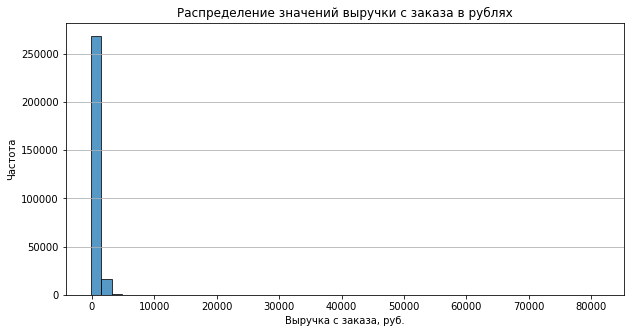

In [34]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(10, 5))

rub_df = df.loc[df['currency_code'] == 'rub']
# Строим гистограмму с помощью pandas через plot(kind='hist')
rub_df['revenue'].plot(
                kind='hist', # Тип графика - гистограмма
                bins=50, # Устанавливаем количество корзин
                alpha=0.75,
                edgecolor='black',
                rot=0, # Градус вращения подписи по оси Х
)

# Настраиваем оформление графика
plt.title('Распределение значений выручки с заказа в рублях')
plt.xlabel('Выручка с заказа, руб.')
plt.ylabel('Частота')
# Добавляем сетку графика
plt.grid(axis='y')

# Выводим график
plt.show()

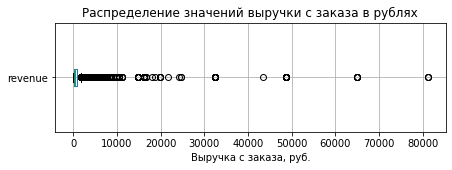

In [35]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(7, 2))

# Строим диаграмму размаха значений в столбце 'seats'
rub_df.boxplot(column='revenue', vert=False)

# Добавляем заголовок и метки оси
plt.title('Распределение значений выручки с заказа в рублях')
plt.xlabel('Выручка с заказа, руб.')

# Выводим график
plt.show()

Имеются выбросы выручки более 10 000 руб.
Отберем для дальнейшего анализа данные по 99-му процентилю.


In [36]:
# Обновим столбец в исходной таблице
before_row_count = df.shape[0]
print(f'Количество строк до удаления выбросов: {before_row_count}')
quant_rev = df['revenue'].loc[df['currency_code'] == 'rub'].quantile(0.99)
        
df = df[(df['currency_code'] == 'rub') & (df['revenue'] <= quant_rev) | (df['currency_code'] == 'kzt')]

after_row_count = df.shape[0]
print(f'Количество строк после удаления выбросов: {after_row_count}')
print(f'Процент выбросов, который был удален: {round((100* (before_row_count - after_row_count) / before_row_count) , 2)}%')

Количество строк до удаления выбросов: 290849
Количество строк после удаления выбросов: 287991
Процент выбросов, который был удален: 0.98%


**Теперь проанализируем выручку в тенге**

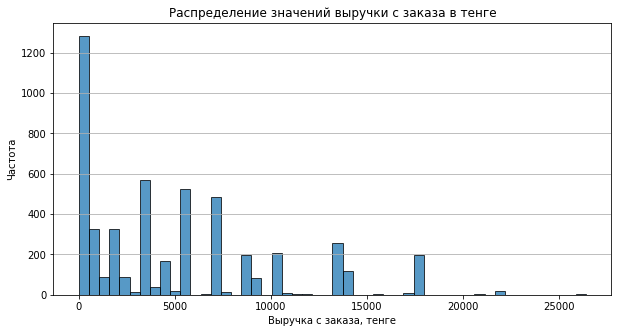

In [37]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(10, 5))

kzt_df = df.loc[df['currency_code'] == 'kzt']
# Строим гистограмму с помощью pandas через plot(kind='hist')
kzt_df['revenue'].plot(
                kind='hist', # Тип графика - гистограмма
                bins=50, # Устанавливаем количество корзин
                alpha=0.75,
                edgecolor='black',
                rot=0, # Градус вращения подписи по оси Х
)

# Настраиваем оформление графика
plt.title('Распределение значений выручки с заказа в тенге')
plt.xlabel('Выручка с заказа, тенге')
plt.ylabel('Частота')
# Добавляем сетку графика
plt.grid(axis='y')

# Выводим график
plt.show()

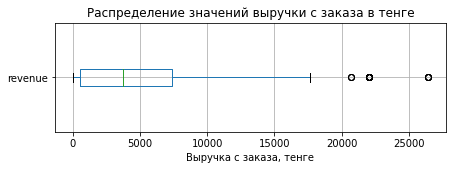

In [38]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(7, 2))

# Строим диаграмму размаха значений в столбце 'seats'
kzt_df.boxplot(column='revenue', vert=False)

# Добавляем заголовок и метки оси
plt.title('Распределение значений выручки с заказа в тенге')
plt.xlabel('Выручка с заказа, тенге')

# Выводим график
plt.show()

In [39]:
# Обновим столбец в исходной таблице
before_row_count = df.shape[0]
print(f'Количество строк до удаления выбросов: {before_row_count}')
quant_rev = df['revenue'].loc[df['currency_code'] == 'kzt'].quantile(0.99)
        
df = df[(df['currency_code'] == 'kzt') & (df['revenue'] <= quant_rev) | (df['currency_code'] == 'rub')]

after_row_count = df.shape[0]
print(f'Количество строк после удаления выбросов: {after_row_count}')
print(f'Процент выбросов, который был удален: {round((100* (before_row_count - after_row_count) / before_row_count) , 2)}%')

Количество строк до удаления выбросов: 287991
Количество строк после удаления выбросов: 287962
Процент выбросов, который был удален: 0.01%


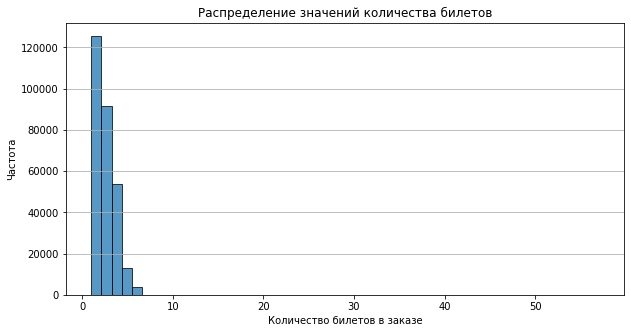

In [40]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(10, 5))

# Строим гистограмму с помощью pandas через plot(kind='hist')
df['tickets_count'].plot(
                kind='hist', # Тип графика - гистограмма
                bins=50, # Устанавливаем количество корзин
                alpha=0.75,
                edgecolor='black',
                rot=0, # Градус вращения подписи по оси Х
)

# Настраиваем оформление графика
plt.title('Распределение значений количества билетов')
plt.xlabel('Количество билетов в заказе')
plt.ylabel('Частота')
# Добавляем сетку графика
plt.grid(axis='y')

# Выводим график
plt.show()

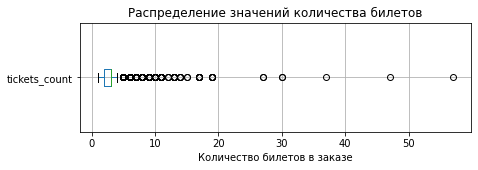

In [41]:
# Создаём контейнер графика matplotlib и задаём его размер
plt.figure(figsize=(7, 2))

# Строим диаграмму размаха значений в столбце 'seats'
df.boxplot(column='tickets_count', vert=False)

# Добавляем заголовок и метки оси
plt.title('Распределение значений количества билетов')
plt.xlabel('Количество билетов в заказе')

# Выводим график
plt.show()

In [42]:
# Обновим столбец в исходной таблице
before_row_count = df.shape[0]
print(f'Количество строк до удаления выбросов: {before_row_count}')
        
df = df[df['tickets_count'] <= df['tickets_count'].quantile(0.99)]

after_row_count = df.shape[0]
print(f'Количество строк после удаления выбросов: {after_row_count}')
print(f'Процент выбросов, который был удален: {round((100* (before_row_count - after_row_count) / before_row_count) , 2)}%')

Количество строк до удаления выбросов: 287962
Количество строк после удаления выбросов: 287782
Процент выбросов, который был удален: 0.06%


In [43]:
print(f'''В результате предобработки было удалено {row_count - after_row_count}.
Процент выбросов, который был удален: {round((100* (row_count - after_row_count) / row_count) , 2)}% ''')

В результате предобработки было удалено 3067.
Процент выбросов, который был удален: 1.05% 


В результате предобработки данных, анализа категориальных значений и выбросов всего было удалено 1,05% строк.

### 2.4 Поиск дубликатов

Поскольку в результате анализа уникальных значений выявлено, что в столбце order_id содержается уникальные ключи и не повторяются по всем строкам, поанализируем дубликаты за исключением данного столбца. Для этого создадим список с названиями колонок датафрейма (за исключением столбца order_id).

In [44]:
# создадим список с названиями колонок по которым могут быть выявлены дубликаты
list_columns=df.columns.tolist()
list_columns.remove('order_id')
print(list_columns)

['user_id', 'created_dt_msk', 'created_ts_msk', 'event_id', 'cinema_circuit', 'age_limit', 'currency_code', 'device_type_canonical', 'revenue', 'service_name', 'tickets_count', 'total', 'days_since_prev', 'event_name', 'event_type_description', 'event_type_main', 'organizers', 'region_name', 'city_name', 'city_id', 'venue_id', 'venue_name', 'venue_address']


In [45]:
# Определим количество строк в датафрейме до удаления дубликатов
initial_row_count = df.shape[0]
print(f'Количество строк до удаления дубликатов: {initial_row_count}')

# Найдите дублирующиеся строки
df_sorted = df.sort_values(by=list_columns)
duplicates = df[df.duplicated(subset=list_columns, keep=False)]
print("Дублирующиеся строки:")
print(duplicates)

# Удалите дублирующиеся строки
df = df.drop_duplicates(subset=list_columns)

# Определите количество строк в датафрейме после удаления дубликатов
final_row_count = df.shape[0]
print(f'Количество строк после удаления дубликатов: {final_row_count}')

Количество строк до удаления дубликатов: 287782
Дублирующиеся строки:
        order_id          user_id created_dt_msk      created_ts_msk  \
11777    1123983  06eb7897f65b433     2024-08-13 2024-08-13 16:31:07   
11778    1123867  06eb7897f65b433     2024-08-13 2024-08-13 16:31:07   
57217     160922  2564e3703075008     2024-10-30 2024-10-30 10:04:15   
57220     160893  2564e3703075008     2024-10-30 2024-10-30 10:04:15   
84010    3363711  3ee7dc2e115847f     2024-06-25 2024-06-25 07:32:08   
84015    3363798  3ee7dc2e115847f     2024-06-25 2024-06-25 07:32:08   
148473   2324032  7b525118ae656af     2024-10-28 2024-10-28 08:33:04   
148477   2323916  7b525118ae656af     2024-10-28 2024-10-28 08:33:04   
154170   5372628  7eb4fc207ecc10f     2024-08-23 2024-08-23 14:08:19   
154173   5372831  7eb4fc207ecc10f     2024-08-23 2024-08-23 14:08:19   
154178   5373179  7eb4fc207ecc10f     2024-08-23 2024-08-23 14:08:19   
154981   3463732  7eb4fc207ecc10f     2024-09-21 2024-09-21 11:43:

При анализе дубликатов можно заметить, что у выявленных дубликатов зачена одна и та же схожесть: дата и время заказа идентичное, заказы сделаны одними и те же уникальными пользователями, сумма заказа идентичная. Можно предположить, что дубликаты возникли из-за технического сбоя. Учитывая их небольшое количество (менее 1% от всех данных), удалим дубликаты.

In [46]:
# Определим количество строк в датафрейме до удаления дубликатов
initial_row_count = tenge_df.shape[0]
print(f'Количество строк до удаления дубликатов: {initial_row_count}')

# Найдите дублирующиеся строки
df_sorted = tenge_df.sort_values(by=tenge_df.columns.tolist())
duplicates = tenge_df[tenge_df.duplicated(keep=False)]
print("Дублирующиеся строки:")
print(duplicates)

# Удалите дублирующиеся строки
tenge_df = tenge_df.drop_duplicates()

# Определите количество строк в датафрейме после удаления дубликатов
final_row_count = tenge_df.shape[0]
print(f'Количество строк после удаления дубликатов: {final_row_count}')

Количество строк до удаления дубликатов: 357
Дублирующиеся строки:
Empty DataFrame
Columns: [data, nominal, curs, cdx]
Index: []
Количество строк после удаления дубликатов: 357


В датафрейме tenge_df отсутствуют дубликаты, что также было подтверждено на предыдущих этапах предобработки данных.

### 2.5 Создание новых столбцов для дальнейшего исследовательского анализа

In [47]:
# Соединяем данные из двух датафреймов "левым" способом, чтобы сохранить все данные
df = df.merge(tenge_df, how='left', left_on = 'created_dt_msk', right_on = 'data')
df.drop(columns=['nominal', 'data', 'cdx'], inplace=True)

In [48]:
# пропишем функцию для конвертации валют
def conversion(row):
    if row['currency_code'] == 'rub':
        return row['revenue']
    else:
        curs_rub = round(row['revenue']/100 * row['curs'] ,2)
        return curs_rub

# создадим новый столбец с выручкой в рублях по всем строкам
df['revenue_rub'] = df.apply(conversion, axis=1)

# проверим корректность полученного столбца
df[df['currency_code'] == 'kzt'].head()

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address,curs,revenue_rub
73,7850214,0033403583a55ed,2024-09-17,2024-09-17 16:52:06,559919,нет,6,kzt,mobile,518.10,Билеты без проблем,4,10361.97,20,f5ec2467-ee48-42f3-89a0-a2d90d1d6fce,событие,другое,№5088,Верхоречная область,Серебрянка,163,1533,"Клуб настольного тенниса ""Фазенда"" Инк","пер. Семашко, д. 8/7 стр. 7",19.012501,98.50
91,8634925,0040e12d70fae81,2024-09-02,2024-09-02 19:49:14,559476,нет,6,kzt,desktop,347.18,Билеты без проблем,3,6943.61,39,61ec7c0e-ea0c-4a3e-a63a-09cbe1bc6177,событие,другое,№5088,Верхоречная область,Серебрянка,163,1533,"Клуб настольного тенниса ""Фазенда"" Инк","пер. Семашко, д. 8/7 стр. 7",18.933001,65.73
98,7625522,0054b38b2653e6e,2024-09-09,2024-09-09 18:06:04,559582,нет,6,kzt,mobile,328.77,Билеты без проблем,4,10959.07,-1,524f434e-0381-4f47-9688-7c4e41961b65,событие,другое,№5088,Верхоречная область,Серебрянка,163,1533,"Клуб настольного тенниса ""Фазенда"" Инк","пер. Семашко, д. 8/7 стр. 7",18.599100,61.15
465,5227657,01370a0e9c1a7d5,2024-06-04,2024-06-04 13:28:17,533803,нет,16,kzt,desktop,7397.66,Мой билет,4,123294.32,1,0686ac7b-6f3e-4177-bb73-16b54acd1223,фестиваль,концерты,№4950,Шанырский регион,Широковка,162,3407,"Арт-кафе ""Речка"" Лимитед","алл. Путейская, д. 548 стр. 7",19.983299,1478.30
466,2229782,01370a0e9c1a7d5,2024-06-04,2024-06-04 13:17:35,533803,нет,16,kzt,mobile,3698.83,Мой билет,2,61647.16,0,0686ac7b-6f3e-4177-bb73-16b54acd1223,фестиваль,концерты,№4950,Шанырский регион,Широковка,162,3407,"Арт-кафе ""Речка"" Лимитед","алл. Путейская, д. 548 стр. 7",19.983299,739.15


In [49]:
# удалим столбец с данными о курсе валют
df.drop(columns=['curs'], inplace=True)

In [50]:
# создадим столбец с выручкой с продажи одного билета на мероприятие.
df['one_ticket_revenue_rub'] = round(df['revenue_rub'] / df['tickets_count'] , 2)

In [51]:
# Извлекем данные о месяце совершения заказа и добавим его в новый столбец
df['month'] = df['created_dt_msk'].dt.month
df.head()

,order_id,user_id,created_dt_msk,created_ts_msk,event_id,cinema_circuit,age_limit,currency_code,device_type_canonical,revenue,service_name,tickets_count,total,days_since_prev,event_name,event_type_description,event_type_main,organizers,region_name,city_name,city_id,venue_id,venue_name,venue_address,revenue_rub,one_ticket_revenue_rub,month
0,4359165,0002849b70a3ce2,2024-08-20,2024-08-20 16:08:03,169230,нет,16,rub,mobile,1521.94,Край билетов,4,10870.99,-1,f0f7b271-04eb-4af6-bcb8-8f05cf46d6ad,спектакль,театр,№3322,Каменевский регион,Глиногорск,213,3972,"Сценический центр ""Деталь"" Групп","алл. Машиностроителей, д. 19 стр. 6",1521.94,380.48,8
1,7965605,0005ca5e93f2cf4,2024-07-23,2024-07-23 18:36:24,237325,нет,0,rub,mobile,289.45,Мой билет,2,2067.51,-1,40efeb04-81b7-4135-b41f-708ff00cc64c,событие,выставки,№4850,Каменевский регион,Глиногорск,213,2941,"Музыкальная школа для детей ""Аккаунт"" Лтд","алл. Шмидта, д. 9 стр. 4",289.45,144.72,7
2,7292370,0005ca5e93f2cf4,2024-10-06,2024-10-06 13:56:02,578454,нет,0,rub,mobile,1258.57,За билетом!,4,13984.16,75,01f3fb7b-ed07-4f94-b1d3-9a2e1ee5a8ca,цирковое шоу,другое,№1540,Каменевский регион,Глиногорск,213,4507,"Училище искусств ""Нирвана"" Инк","алл. Юбилейная, д. 5/6",1258.57,314.64,10
3,1139875,000898990054619,2024-07-13,2024-07-13 19:40:48,387271,нет,0,rub,mobile,8.49,Лови билет!,2,212.28,-1,2f638715-8844-466c-b43f-378a627c419f,выставка,другое,№5049,Североярская область,Озёрск,2,3574,"Театр альтернативного искусства ""Ода"" Лимитед","алл. Есенина, д. 243 к. 3/8",8.49,4.24,7
4,972400,000898990054619,2024-10-04,2024-10-04 22:33:15,509453,нет,18,rub,mobile,1390.41,Билеты без проблем,3,10695.43,83,10d805d3-9809-4d8a-834e-225b7d03f95d,шоу,стендап,№832,Озернинский край,Родниковецк,240,1896,"Театр кукол ""Огни"" Инкорпорэйтед","ш. Набережное, д. 595 стр. 8",1390.41,463.47,10


In [52]:
df['season'] = pd.cut(
    df['month'], 
    bins=[6, 9, 11], 
    labels=["лето", "осень"], 
    right=False)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 287752 entries, 0 to 287751
Data columns (total 28 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   order_id                287752 non-null  int32         
 1   user_id                 287752 non-null  object        
 2   created_dt_msk          287752 non-null  datetime64[ns]
 3   created_ts_msk          287752 non-null  datetime64[ns]
 4   event_id                287752 non-null  int32         
 5   cinema_circuit          287752 non-null  object        
 6   age_limit               287752 non-null  int8          
 7   currency_code           287752 non-null  object        
 8   device_type_canonical   287752 non-null  object        
 9   revenue                 287752 non-null  float64       
 10  service_name            287752 non-null  object        
 11  tickets_count           287752 non-null  int8          
 12  total                   287752

Предобработаем данные по новым столбцам. Пропуски по новым столбцам отсутствуют. Заменим тип данных по новым столбцам.
Понизим разрядность по столбцам revenue_rub, one_ticket_revenue_rub, month для ускорения производительности (без изменения типа).

In [54]:
# Ппонижаем разрядность по столбцу month
df['month'] = pd.to_numeric(df['month'], errors='coerce', downcast='integer')
type_col = df['month'].dtypes
print(f'{column} изменен тип на {type_col}')

region_name изменен тип на int8


In [55]:
# Ппонижаем разрядность по столбцам revenue_rub, one_ticket_revenue_rub
columns = ['revenue_rub', 'one_ticket_revenue_rub']
for column in columns:
    df[column] = pd.to_numeric(df[column], errors='coerce', downcast='float')
    type_col = df[column].dtypes
    print(f'{column} изменен тип на {type_col}')

revenue_rub изменен тип на float32
one_ticket_revenue_rub изменен тип на float32


### 2.6 Итоги по шагу 2

В результате первичного ознакомления с данными датафрейма `df` установлено:
* Пропуски выявлены только в 1 столбце из первоначального датафрейма `orders_df` : `days_since_prev` (7,54% строк с пропусками), и в столбцах из первоначального датафрейма `events_df` имеется 238 незаполненных строк. Это значит, что отсутствуют данные о мероприятиях по 238 покупкам;
* Тип данных в большинстве столбцов верный. Заменены тип данных в столбце `created_dt_msk` и `created_ts_msk` с `object` на `date`. По столбцам `city_id` `venue_id` заменены float на int. По столбцам с числовыми данными понижена разрядность для повышения производительности
* При первом ознакомлении с данными, названия столбцов соответствуют фактическим данным в них. 
* Стиль наименования столбцов соответствует snake case.
* Столбец `order_id` фактически является ключом в данном столбце. Количество уникальных названий соответствует количеству строк.
* Заменены пропуски в столбце `days_since_prev`, `city_id`, `venue_id` на индикатор -1 для корректного смена типов данных.
* В целом по всем категориальным данным значения корректны. При проверке категориальных данных было выявлено, в столбце `event_type_description` имеется тип мероприятия "снегурочка", определить к какому мероприятию конкретно можно отнести не представляется возможным по предоставленным данным. Поскольку данный столбец не участвует непосредственно в дальнейшем анализе, распределение данных по данному столбцу не исследуется, а количество строк с такими данными относятся к менее чем 1%, проигнорируем данный факт, оставим данные в первоначальном виде. Согласно данным уникальных названий регионов, выявлено, что часть регионов имеют схожие названия. В рамках данного проекта были использованы вымышленные названия городов и регионов, данный факт затрудняет проверку корректности данных. Поскольку по выявленным схожим названиям регионов соответствуют различные названия городов, допустим, что названия регионов были введены корректно.
* В результате анализа выбросов были проанализированы распределения по столбцам `revenue` (в разрезе различных валют), `tickets_count`. По обоим распределениям были выявлены хвосты в правой части. Было удалены выбросы по 99-процентилю, что в общем составило около 1%.
* Явные дубликаты в датафрейме отсутствуют. Неявные дубликаты были удалены (дублирующиеся строки по всем столбцам кроме `order_id`).
* Итого в результате предобработки было удалено 1,05% строк.
* Были созданы новые столбцы `revenue_rub`, `one_ticket_revenue_rub`, `month`, `season`, необходимые для исследовательского анализа. Пропуски по новым столбцам отсутствуют. Произведена замена тип данных по новым столбцам: понизжена разрядность по столбцам revenue_rub, one_ticket_revenue_rub, month для ускорения производительности (без изменения типа).

В результате первичного ознакомления с данными датафрейма `tenge_df` установлено:
* Типы данных в столбцах верные, смена не требовалась.
* Пропуски отсутствуют.
* Дубликаты отсутствуют.
* Курс тенге к рублю предоставлен за период с 2024-01-10 до 2024-12-31.
* Учитывая отсутствие пропусков по датафрейму tenge_df, количество уникальных значений, а также период, за который приведены данные, можно сделать вывод о корректности данных.

## Шаг 3.  Исследовательский анализ данных

### 3.1. Анализ распределения заказов по сегментам и их сезонные изменения

**Для каждого месяца найдем количество заказов и визуализируем результаты. П**

In [56]:
# Для каждого месяца найдем количество заказов
month_orders = df.groupby('month')['order_id'].count()
month_orders

month
6     34326
7     40381
8     44538
9     69293
10    99214
Name: order_id, dtype: int64

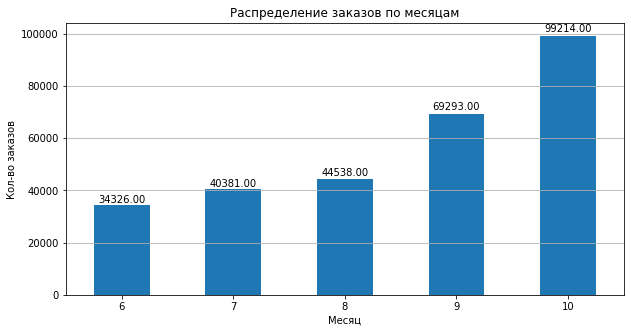

In [57]:
# Построим график столбчатой диаграммы
month_orders.plot(kind='bar',
               title=f'Распределение заказов по месяцам',
               legend=False,
               ylabel='Кол-во заказов',
               xlabel='Месяц',
               rot=0,
               figsize=(10, 5))
plt.grid(axis='y')
ax = plt.gca()
autolabel(ax.patches, height_factor=1.01)

# Выводим график
plt.show()

В результате сравнения распределения заказов по месяцам возможно заметить динамику на увеличение количества заказов от июня к октябрю 2024 г. Количество заказов в октябре 2024 составляет почти в 3 раза больше, чем в июне 2024 г.

**Для осеннего и летнего периодов сравним распределение заказов билетов по разным категориям: тип мероприятия, тип устройства, категория мероприятия по возрастному рейтингу**

In [59]:
# Расчитаем долю заказов в разные сезоны по типам мероприятий
share_type = df.groupby('season')['event_type_main'].value_counts(normalize=True).unstack(fill_value=0).T
share_type

season,лето,осень
event_type_main,,
выставки,0.020298,0.014458
другое,0.271379,0.196783
концерты,0.426392,0.372045
спорт,0.025238,0.111998
стендап,0.053315,0.041090
театр,0.201085,0.253601
ёлки,0.002294,0.010025


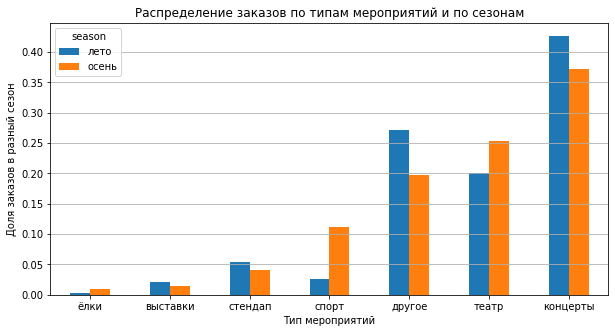

In [60]:
# Построим график столбчатой диаграммы
share_type.sort_values(by='осень').plot(kind='bar',
               title=f'Распределение заказов по типам мероприятий и по сезонам',
               legend=True,
               ylabel='Доля заказов в разный сезон',
               xlabel='Тип мероприятий',
               rot=0,
               figsize=(10, 5))
plt.grid(axis='y')

# Выводим график
plt.show()

В результате анализа распределения заказовв разрезе типов мероприятий, возможно заметить, что в осенний период наиболее популярными мероприятиями являютчя концерты, театры и другие, в летний период данные мероприятия также является популярными. Также стоит отметить, что с появлением осеннего сезона возрастает спрос на спортивные мероприятия, театры и елки, снижается спрос на выставки, стендап, концерты и другое.

In [61]:
# Расчитаем долю заказов в разные сезоны по типам устройств
share_device = df.groupby('season')['device_type_canonical'].value_counts(normalize=True).unstack(fill_value=0).T
share_device

season,лето,осень
device_type_canonical,,
desktop,0.193492,0.203291
mobile,0.806508,0.796709


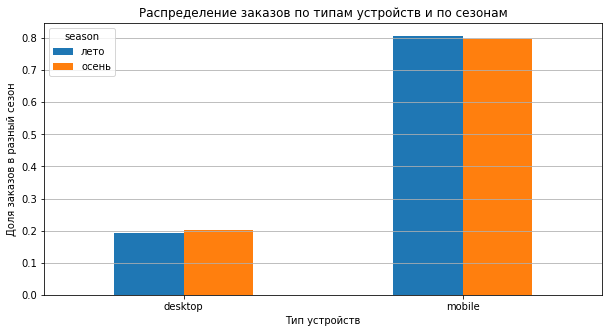

In [62]:
# Построим график столбчатой диаграммы

share_device.sort_values(by='осень').plot(kind='bar',
               title=f'Распределение заказов по типам устройств и по сезонам',
               legend=True,
               ylabel='Доля заказов в разный сезон',
               xlabel='Тип устройств',
               rot=0,
               figsize=(10, 5))
plt.grid(axis='y')

# Выводим график
plt.show()

В разрезе типов устройств есть небольшие различия в перераспределении заказов по устройствам, однако их доля меняется менее чем на 1 %. 

In [63]:
# Расчитаем долю заказов в разные сезоны по типам устройств
share_age_limit = df.groupby('season')['age_limit'].value_counts(normalize=True).unstack(fill_value=0).T
share_age_limit

season,лето,осень
age_limit,,
0,0.179337,0.236228
6,0.181802,0.176272
12,0.205619,0.220893
16,0.283190,0.262405
18,0.150052,0.104203


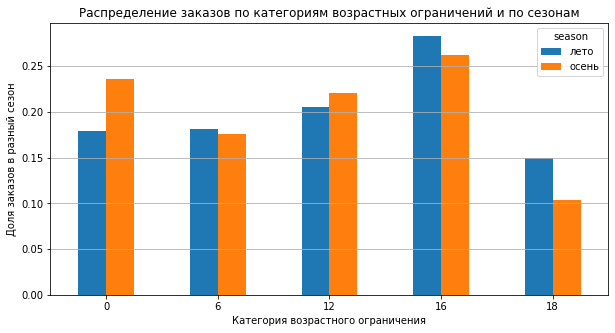

In [64]:
# Построим график столбчатой диаграммы

share_age_limit.plot(kind='bar',
               title=f'Распределение заказов по категориям возрастных ограничений и по сезонам',
               legend=True,
               ylabel='Доля заказов в разный сезон',
               xlabel='Категория возрастного ограничения',
               rot=0,
               figsize=(10, 5))
plt.grid(axis='y')

# Выводим график
plt.show()

Согласно распределению заказов по категориям возрастных ограничений в разрезе периодов, замечено:
* в осенний период возрастает спрос на мероприятия 0+. Это может быть вызвано окончанием сезона отпусков, началом театрального сезона на большинстве площадок. Также возрастает мероприятия 12+. 
* по прочим категориям встречается некоторые снижения спроса на мероприятия. Это может быть связано с тем, что в категорию 6+ попадают "первоклашки", в 16+ школьники старших классов, студенты первых курсов колледжей, у которых начинается важный этап в жизни и интерес к развлекательным мероприятиям несколько утихает. В категорию 18+ входит большая группа людей, если рассматривать платежеспособную часть населения, то это как правило, люди работающие, которые выходят из сезона отпусков, после отпусков не располагают временно свободными средствами для развлекательных мероприятия. Однако, данный период кратковременный.

**Изучим изменение выручки с продажи одного билета в зависимости от типа мероприятия летом и осенью**

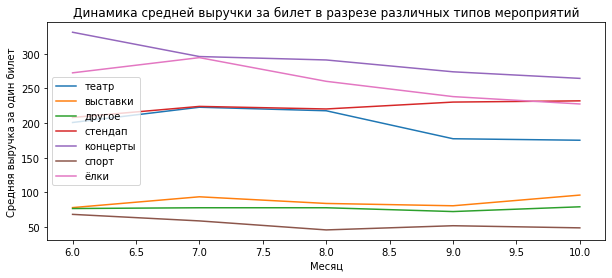

In [65]:
# Создаём фигуру графика
plt.figure(figsize=(10, 4))

# Строим линейный график для каждого значения event_type_main
for i in df['event_type_main'].dropna().unique():
    # Фильтруем данные по значению столбца churn
    df.loc[df['event_type_main'] == i].groupby('month')['one_ticket_revenue_rub'].mean().plot(kind='line', label=i)
    

# Настраиваем оси
plt.title('Динамика средней выручки за билет в разрезе различных типов мероприятий')
plt.xlabel('Месяц')
plt.ylabel('Средняя выручка за один билет')
plt.legend()
plt.show()



В разрезе типов мероприятий динамика средней выручки за билет стоит отметить:
* по типам мероприятий: елки, выставки, стендап, театр наблюдается небольшой скачок средней выручки за билет в июле 2024 г. по сравнению с предыдущим месяцем.
* по типам мероприятий: концерты, елки, театры наблюдается небольшое падение показателя в сентябре 2024 по сравнению с предыдущим месяцем; по стендап и спорт мероприятиям, напротив повышение.
* за весь рассматриваемый период наблюдается планомерный рост по мероприятиям стендап и выставки.

**Для каждого типа мероприятия рассчитаем среднее значение выручки с одного билета, найдем относительное изменение осенних значений по сравнению с летними.**

In [66]:
# рассчитаем среднюю выручку с билета осенью
autumn_ticket_revenue_type = df.loc[df['season'] == 'осень'].groupby('event_type_main')['one_ticket_revenue_rub'].mean()
autumn_ticket_revenue_type

event_type_main
выставки     90.603424
другое       76.059677
концерты    268.106934
спорт        49.986389
стендап     231.124954
театр       175.984085
ёлки        229.563309
Name: one_ticket_revenue_rub, dtype: float32

In [67]:
# рассчитаем среднюю выручку с билета летом
summer_ticket_revenue_type = df.loc[df['season'] == 'лето'].groupby('event_type_main')['one_ticket_revenue_rub'].mean()
summer_ticket_revenue_type

event_type_main
выставки     86.415527
другое       77.391968
концерты    304.731659
спорт        50.745060
стендап     218.518204
театр       214.166962
ёлки        271.435425
Name: one_ticket_revenue_rub, dtype: float32

In [68]:
# рассчитаем относительное изменение осенних значений от летних в %
share_ticket_revenue_type = round((autumn_ticket_revenue_type / summer_ticket_revenue_type -1)*100 , 2)
share_ticket_revenue_type

event_type_main
выставки     4.85
другое      -1.72
концерты   -12.02
спорт       -1.50
стендап      5.77
театр      -17.83
ёлки       -15.43
Name: one_ticket_revenue_rub, dtype: float32

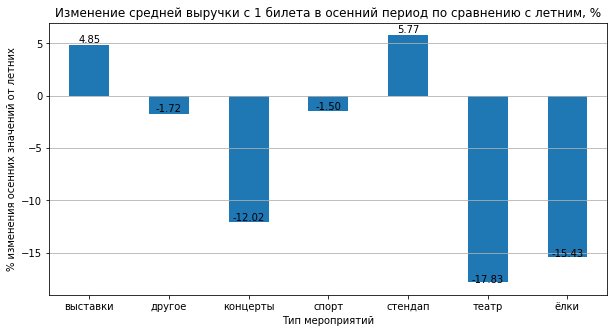

In [69]:
# Построим график столбчатой диаграммы

share_ticket_revenue_type.plot(kind='bar',
               title=f'Изменение средней выручки с 1 билета в осенний период по сравнению с летним, %',
               ylabel='% изменения осенних значений от летних',
               xlabel='Тип мероприятий',
               rot=0,
               figsize=(10, 5))
plt.grid(axis='y')
ax = plt.gca()
autolabel(ax.patches, height_factor=1.01)

# Выводим график
plt.show()

Согласно полученной визуализации можно заметить, что в осенний период упала выручка за 1 билет по мероприятиям:
* театры -17,83%
* елки -15,43%
* концерты -12,02%
* спорт -1,5%
* другое -1,72%

Наблюдается рост выручки с 1 билета в осенний период по мероприятиям:
* стендап 5,77%
* выставки 4,85%

Таким образом, можно отметить, что средняя выручка за 1 билет в целом в осенний период падает по сравнению с летним периодом.

### 3.2 Осенняя активность пользователей

**Проанализируем динамику изменений по дням для:**
* общего числа заказов;
* количества активных пользователей DAU;
* среднего числа заказов на одного пользователя;
* средней стоимости одного билета.

In [70]:
# сохраним срез в переменной для дальнейшего анализа данных за осенний период
df_autumn = df.loc[df['season'] == 'осень'].reset_index(drop=True)

# рассчитаем покатели общего числа заказов, кол-во уникальных пользователей и средней стоимости одного билета
day_activity = df_autumn.groupby('created_dt_msk').agg({'order_id': 'count', 'user_id': 'nunique', 'one_ticket_revenue_rub': 'mean'})
# добавим данные с расчетом среднего числа заказов на одного пользователя
day_activity['order_users'] = round(day_activity['order_id'] / day_activity['user_id'], 4)
# округлим данные о средней стоимости 1 билета
day_activity['one_ticket_revenue_rub'] = round(day_activity['one_ticket_revenue_rub'], 2)

day_activity

,order_id,user_id,one_ticket_revenue_rub,order_users
created_dt_msk,,,,
2024-09-01,1327,564,200.169998,2.3528
2024-09-02,1380,574,189.460007,2.4042
2024-09-03,5111,778,80.129997,6.5694
2024-09-04,1772,684,177.710007,2.5906
2024-09-05,1940,739,189.759995,2.6252
2024-09-06,2123,864,174.869995,2.4572
2024-09-07,1957,794,190.210007,2.4647
2024-09-08,1713,717,181.970001,2.3891
2024-09-09,2092,779,159.429993,2.6855


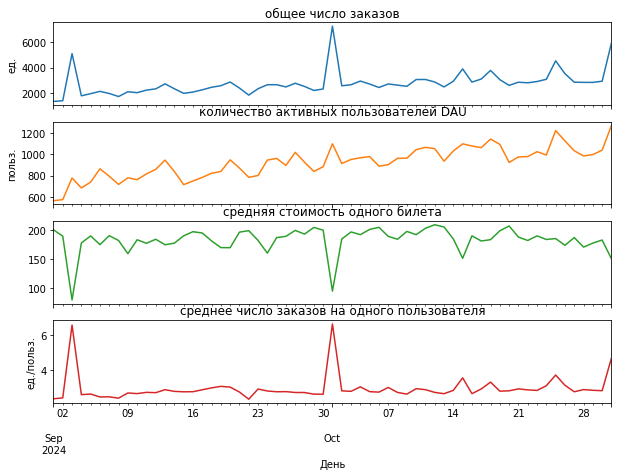

In [71]:
# Строим линейный график
axes = day_activity.plot(kind='line', 
            subplots=True,
            sharex=True,
            sharey=False,
            legend=False,
            figsize=(10,7),
            title=['общее число заказов', 'количество активных пользователей DAU', 'средняя стоимость одного билета',  'среднее число заказов на одного пользователя'])

# Устанавливаем подпись для оси Y каждого из подграфиков
axes[0].set_ylabel('ед.')
axes[1].set_ylabel('польз.')
axes[3].set_ylabel('руб./ед.')
axes[3].set_ylabel('ед./польз.')

# Настраиваем оси
plt.xlabel('День')
plt.show()

В результате анализа ежедневной динамики можно отметить:
* за исключением пару скачков, в целом наблюдается планомерный рост показателя общего числа заказов за осенний период.
* также наблюдается и планомерное увеличение количества активных пользователей.
* в начале сентября и октября наблюдается резкие скачки в общем числе заказов и среднем числе заказов на одного пользователя, в то же время в средней стоимость 1 билета наблюдается резкое падение. 
* динамика стоимости 1 билета и среднего числа заказов в целом стабильна, за исключением пару моментов. 

Стоит дополнительно проанализировать моменты скачков и резких падений. Согласно таблицам, такие моменты встречаются 03.09.2024 и 01.10.2024 г. Возможно в данные периоды проводились какие-то маркетинговые мероприятия.

In [72]:
# добавим в датафрейм столбец с данными о дне недели (1- понедельник, 2- вторник и т.д.)
df_autumn['dow'] =  df_autumn['created_dt_msk'].dt.dayofweek + 1

# рассчитаем данные по дням недели общего числа заказов, кол-во уникальных пользователей и средней стоимости одного билета
week_activity = df_autumn.groupby('dow').agg({'order_id': 'count', 'user_id': 'nunique', 'one_ticket_revenue_rub': 'mean'})
# добавим данные с расчетом среднего числа заказов на одного пользователя
week_activity['order_users'] = round(week_activity['order_id'] / week_activity['user_id'], 4)
# округлим данные о средней стоимости 1 билета
week_activity['one_ticket_revenue_rub'] = round(week_activity['one_ticket_revenue_rub'], 2)
week_activity

,order_id,user_id,one_ticket_revenue_rub,order_users
dow,,,,
1,21504,4446,184.119995,4.8367
2,31468,4793,140.509995,6.5654
3,22868,4811,185.759995,4.7533
4,27153,4969,177.949997,5.4645
5,24804,4869,185.630005,5.0943
6,21327,4569,192.119995,4.6678
7,19383,4392,197.960007,4.4133


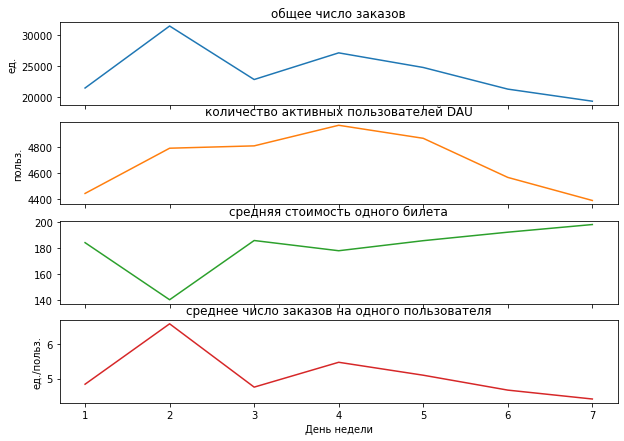

In [73]:
# Строим линейный график
axes = week_activity.plot(kind='line', 
            subplots=True,
            sharex=True,
            sharey=False,
            legend=False,
            figsize=(10,7),
            title=['общее число заказов', 'количество активных пользователей DAU', 'средняя стоимость одного билета',  'среднее число заказов на одного пользователя'])

# Устанавливаем подпись для оси Y каждого из подграфиков
axes[0].set_ylabel('ед.')
axes[1].set_ylabel('польз.')
axes[3].set_ylabel('руб./ед.')
axes[3].set_ylabel('ед./польз.')

# Настраиваем оси
plt.xlabel('День недели')
plt.show()

Согласно линейным графикам к концу недели наблюдается снижение пользовательской активности с увеличением средней стоимости одного билета.
Данный факт может свидетельствовать о том, что пользователи, как правило, предпочитают готовиться заранее к выходному досугу и приобретать билеты в будние дни (преимущественно во вторник). Рост стоимости одного билета к выходным может свидетельствовать о том, что непосредственно перед мероприятиями стоимость билетов может возрастать (когда первым делом раскупили "дешевые" билеты и в продаже остались "дорогие"). Это также может объяснять рост количества активных пользователей в середине недели (четверг), когда пользователи продолжают отслеживать появление в продаже "дешевых" билетов перед мероприятиями выходных дней.

### 3.3 Популярные события и партнёры

**Для каждого региона посчитаем уникальное количество мероприятий и общее число заказов**

In [74]:
region_activity = df_autumn.groupby('region_name').agg({'event_id':'nunique', 'order_id':'count'}).sort_values(by='event_id', ascending=False)
region_activity

,event_id,order_id
region_name,,
Каменевский регион,3910,46669
Североярская область,2610,20655
Широковская область,803,8715
Светополянский округ,764,4778
Речиновская область,529,3564
Серебринская область,456,4467
Яблоневская область,432,4198
Тепляковская область,419,2485
Горицветская область,406,3230


In [75]:
share_region_activity = region_activity / region_activity.sum()
(share_region_activity.style.background_gradient(cmap='coolwarm'))

,event_id,order_id
region_name,,
Каменевский регион,0.246377,0.276992
Североярская область,0.164461,0.122593
Широковская область,0.050599,0.051726
Светополянский округ,0.048141,0.028359
Речиновская область,0.033333,0.021153
Серебринская область,0.028733,0.026513
Яблоневская область,0.027221,0.024916
Тепляковская область,0.026402,0.014749
Горицветская область,0.025583,0.019171


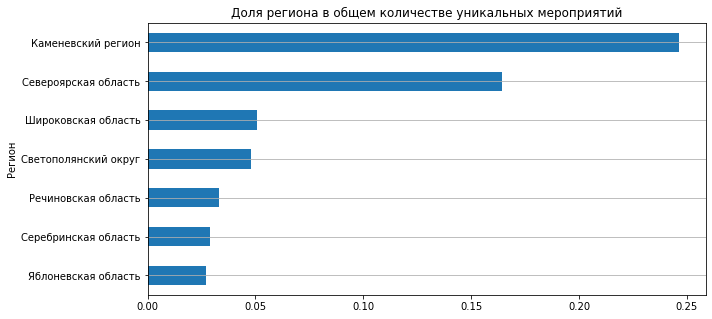

In [76]:
# Построим график линейчатой диаграммы для топ7
share_region_activity['event_id'].head(7).sort_values().plot(kind='barh',
               title='Доля региона в общем количестве уникальных мероприятий',
               legend=False,
               ylabel='Доля региона',
               xlabel='Регион',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')

# Выводим график
plt.show()

Таким образом выявлен топ7 регионов с наибольшим разнообразием мероприятий:
* Каменевский регион, доля около 0,25. Для данного региона установлена и самая большая доля по количеству заказов.
* Североярская область, доля около 0,16. Данный регион также занимает второе место по количеству заказов.
* Широковская область, доля около 0,05.
* Светополянский округ, Речиновская область, Серебринская область, Яблоневская область. Их доля составляет менее 0,05. Стоит отметить что с сопоставимой долей около 0,02 имеется также большое количество регионов.

Также стоит отметить Медовская область, она не входит в топ7 регионов с наибольшим разнообразием мероприятий, однако занимает 3 место по количеству заказов.

**Для каждого билетного партнёра посчитаем общее число уникальных мероприятий, обработанных заказов и суммарную выручку с заказов билетов**

In [77]:
venue_activity = df_autumn.groupby('venue_name').agg({'event_id':'nunique', 'order_id':'count', 'revenue_rub':'sum'})
venue_activity['revenue_rub'] = round(venue_activity['revenue_rub'])
venue_activity.sort_values(by='event_id', ascending=False)

,event_id,order_id,revenue_rub
venue_name,,,
"Дворец культуры ""Скворечник"" Инк",251,2509,640026.0
"Фестивальный проект ""Листья"" Групп",222,1775,1298258.0
"Творческое объединение ""Гармония"" Инк",146,649,388039.0
"Этнографический музей ""Магнит"" Групп",138,1670,301007.0
"Центр культурного наследия ""Заряд"" и партнеры",138,3067,757008.0
"Совет искусства ""Шар"" и партнеры",129,1249,860670.0
"Студия анимации ""Fusion"" Групп",107,730,500646.0
"Литературная мастерская ""Эксплорер"" Групп",101,299,53011.0
"Театр ""Задор"" Инкорпорэйтед",101,761,195978.0


In [78]:
share_venue_activity = venue_activity / venue_activity.sum()

(share_venue_activity.sort_values(by='event_id', ascending=False).style.background_gradient(cmap='coolwarm'))

,event_id,order_id,revenue_rub
venue_name,,,
"Дворец культуры ""Скворечник"" Инк",0.015816,0.014892,0.007836
"Фестивальный проект ""Листья"" Групп",0.013989,0.010535,0.015894
"Творческое объединение ""Гармония"" Инк",0.009200,0.003852,0.004751
"Этнографический музей ""Магнит"" Групп",0.008696,0.009912,0.003685
"Центр культурного наследия ""Заряд"" и партнеры",0.008696,0.018203,0.009268
"Совет искусства ""Шар"" и партнеры",0.008129,0.007413,0.010537
"Студия анимации ""Fusion"" Групп",0.006742,0.004333,0.006129
"Литературная мастерская ""Эксплорер"" Групп",0.006364,0.001775,0.000649
"Театр ""Задор"" Инкорпорэйтед",0.006364,0.004517,0.002399


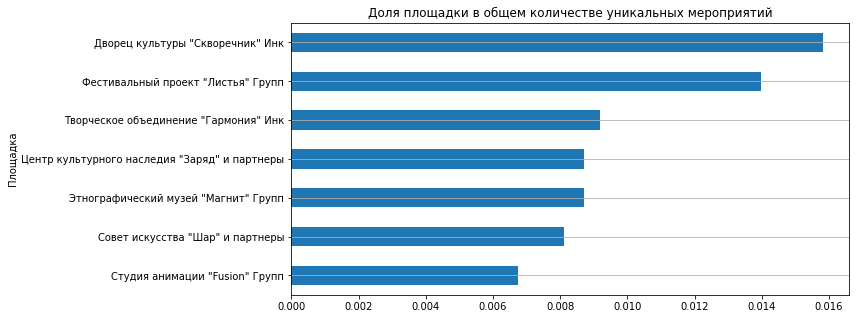

In [79]:
# Построим график линейчатой диаграммы для топ7
top7 = share_venue_activity.sort_values(by='event_id', ascending=False)
top7['event_id'].head(7).sort_values().plot(kind='barh',
               title='Доля площадки в общем количестве уникальных мероприятий',
               legend=False,
               ylabel='Доля площадки',
               xlabel='Площадка',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')

# Выводим график
plt.show()

Наибольшее разнообразие мероприятий предоставляет Дворец культуры "Скворечник" Инк, его доля составляет около 1,5%.
Также сопоставимую долю имеет Фестивальный проект "Листья" Групп, менее 1,4%.

Прочие площадки, входящие в топ 7: Творческое объединение "Гармония" Инк, Этнографический музей "Магнит" Групп, Центр культурного наследия "Заряд" и партнеры, Совет искусства "Шар" и партнеры, обладают долей около 0,8-0,9%. Топ7 закрывает Студия анимации "Fusion" Групп с долей менее 0,7%.

Стоит отметить, что площадки, входящие в топ7 по разнообразию мероприятий, не обладают самой высокой долей по количеству заказов и по суммарной выручке.

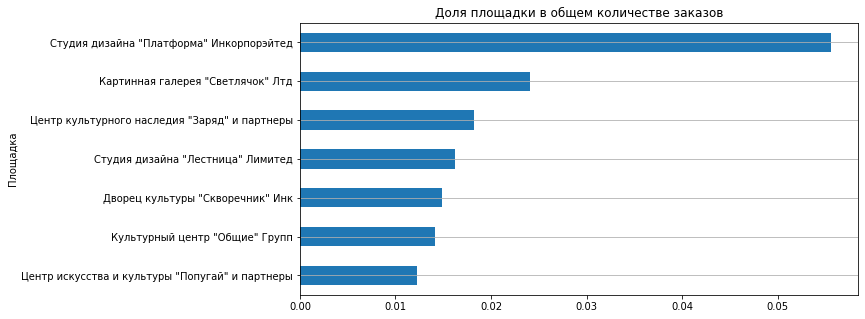

In [80]:
# Построим график линейчатой диаграммы для топ7 по количеству заказов
top7 = share_venue_activity.sort_values(by='order_id', ascending=False)
top7['order_id'].head(7).sort_values().plot(kind='barh',
               title='Доля площадки в общем количестве заказов',
               legend=False,
               ylabel='Доля площадки',
               xlabel='Площадка',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')

# Выводим график
plt.show()

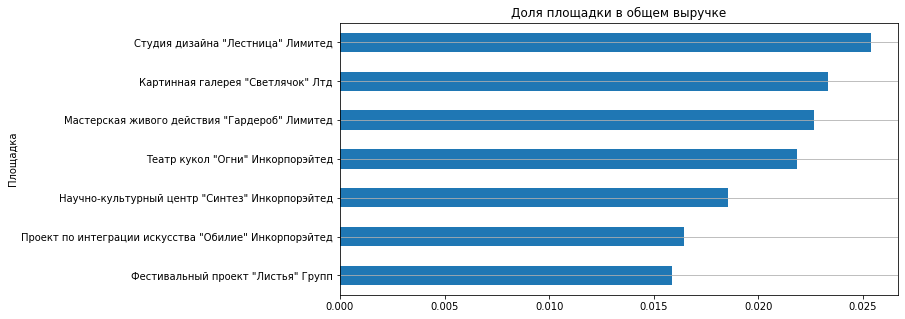

In [81]:
# Построим график линейчатой диаграммы для топ7 по суммарной выручке
top7 = share_venue_activity.sort_values(by='revenue_rub', ascending=False)
top7['revenue_rub'].head(7).sort_values().plot(kind='barh',
               title='Доля площадки в общем выручке',
               legend=False,
               ylabel='Доля площадки',
               xlabel='Площадка',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')

# Выводим график
plt.show()

Таким образом, по количеству заказов топ 7 возглавляет площадка Студия дизайна "Платформа" Инкорпорэйтед, по суммарной выручке Студия дизайна "Лестница" Лимитед. 

### 3.4 Итоги по шагу 3

В результате проведения исследовательского анализа было получено:
* Заметна динамика на увеличение количества заказов от июня к октябрю 2024 г. Количество заказов в октябре 2024 составляет почти в 3 раза больше, чем в июне 2024 г.
* В осенний период наиболее популярными мероприятиями являются концерты, театры и другие, в летний период данные мероприятия также является популярными. Также стоит отметить, что с появлением осеннего сезона возрастает спрос на спортивные мероприятия, театры и елки, снижается спрос на выставки, стендап, концерты и другое. В разрезе типов устройств есть небольшие различия в перераспределении заказов по устройствам, однако их доля меняется менее чем на 1 %.
* Согласно распределению заказов по категориям возрастных ограничений в разрезе периодов, замечено в осенний период возрастает спрос на мероприятия 0+, 12+. По прочим категориям встречается некоторые снижения спроса на мероприятия. 
* В разрезе типов мероприятий динамика средней выручки по типам мероприятий: елки, выставки, стендап, театр наблюдается небольшой скачок средней выручки за билет в июле 2024 г. по сравнению с предыдущим месяцем. По типам мероприятий: концерты, елки, театры наблюдается небольшое падение показателя в сентябре 2024 по сравнению с предыдущим месяцем; по стендап и спорт мероприятиям, напротив повышение.  За весь рассматриваемый период наблюдается планомерный рост по мероприятиям стендап и выставки.
* Согласно полученной визуализации можно заметить, что в осенний период упала выручка за 1 билет по мероприятиям театры, елки, концерты, спорт, другое. Наблюдается рост выручки с 1 билета в осенний период по мероприятиям стендап, выставки. Можно отметить, что средняя выручка за 1 билет в целом в осенний период падает по сравнению с летним периодом.
* В результате анализа ежедневной динамики можно отметить динамика стоимости 1 билета и среднего числа заказов в целом стабильна, за исключением пару моментов. За исключением пару скачков, в целом наблюдается планомерный рост показателя общего числа заказов за осенний период.Также наблюдается и планомерное увеличение количества активных пользователей. В начале сентября и октября наблюдается резкие скачки в общем числе заказов и среднем числе заказов на одного пользователя, в то же время в средней стоимость 1 билета наблюдается резкое падение. 
* Выявлен топ7 регионов с наибольшим разнообразием мероприятий Каменевский регион, Североярская область, Широковская область, Светополянский округ, Речиновская область, Серебринская область, Яблоневская область. Также стоит отметить Медовская область, она не входит в топ7 регионов с наибольшим разнообразием мероприятий, однако занимает 3 место по количеству заказов.
* Наибольшее разнообразие мероприятий предоставляет Дворец культуры "Скворечник" Инк, Фестивальный проект "Листья" Групп. Прочие площадки, входящие в топ 7: Творческое объединение "Гармония" Инк, Этнографический музей "Магнит" Групп, Центр культурного наследия "Заряд" и партнеры, Совет искусства "Шар" и партнеры, также входят в топ7. Топ7 закрывает Студия анимации "Fusion" Групп с долей менее 0,7%. Стоит отметить, что площадки, входящие в топ7 по разнообразию мероприятий, не обладают самой высокой долей по количеству заказов и по суммарной выручке. Таким образом, по количеству заказов топ 7 возглавляет площадка Студия дизайна "Платформа" Инкорпорэйтед, по суммарной выручке Студия дизайна "Лестница" Лимитед.

### Шаг 4. Статистический анализ данных

**Проверьте две гипотезы, которые предполагают большую активность пользователей мобильных устройств:**

1. Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств.

2. Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.

#### 4.1 Проверка гипотезы о среднем количестве заказов на одного пользователя разных типов устройств

##### 4.1.1 Проверка дизайна теста

In [82]:
# расчитаем ключевые показатели по группе
device_group = df_autumn.groupby('device_type_canonical').agg({'order_id': 'count', 'user_id': 'nunique'})
device_group['order_users'] = round(device_group['order_id'] / device_group['user_id'], 4)
device_group

,order_id,user_id,order_users
device_type_canonical,,,
desktop,34256,4867,7.0384
mobile,134251,14185,9.4643


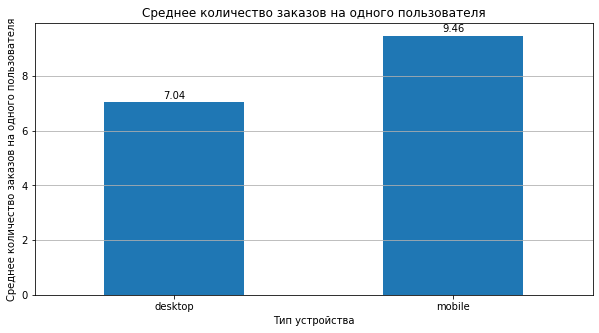

In [83]:
# Построим график столбчатой диаграммы
device_group['order_users'].plot(kind='bar',
               title='Среднее количество заказов на одного пользователя',
               legend=False,
               ylabel='Среднее количество заказов на одного пользователя',
               xlabel='Тип устройства',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')
ax = plt.gca()
autolabel(ax.patches, height_factor=1.01)

# Выводим график
plt.show()

Среднее количество заказов на пользователя для группы пользователей, совершающих заказ с мобильных устройств, составляет 9,46, с декстопных устройств 7,04.

In [84]:
# осуществим срез по группам с отбором пользователей и подсчетом количества заказов
device_users = df_autumn.groupby(['device_type_canonical', 'user_id'])['order_id'].count().reset_index()
device_users

,device_type_canonical,user_id,order_id
0,desktop,0028d17a676f8c8,1
1,desktop,002b75ca606ba46,3
2,desktop,002ec276eee9b0b,1
3,desktop,0040e12d70fae81,1
4,desktop,005fefeabf1e678,3
5,desktop,006d1660d830822,7
6,desktop,009201290d7316b,1
7,desktop,00937de412ea430,3
8,desktop,00ab1d21393d532,1
9,desktop,00bdfa36a6e542b,1


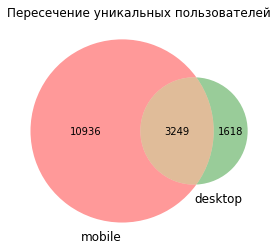

In [85]:
# Определим уникальные значения пользователей
A_id = set(device_users['user_id'].loc[device_users.device_type_canonical == 'mobile'].dropna().unique())
B_id = set(device_users['user_id'].loc[device_users.device_type_canonical == 'desktop'].dropna().unique())

# Строим диаграмму Венна
venn2([A_id, B_id], set_labels=('mobile', 'desktop'))
# Отображаем график
plt.title("Пересечение уникальных пользователей")
plt.show()

Пользователи в обоих выборках не должны пересекаться для проведения статистических тестов, поэтому удалим пересекающихся уникальных пользователей.

In [86]:
# Удалим дублирующиеся строки
device_users = device_users.drop_duplicates(subset='user_id', keep=False)
device_users = device_users.reset_index(drop=True)
# Выводим информацию о датафрейме
device_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12554 entries, 0 to 12553
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   device_type_canonical  12554 non-null  object
 1   user_id                12554 non-null  object
 2   order_id               12554 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 294.4+ KB


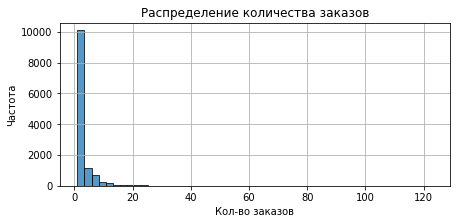

In [87]:
plt.figure(figsize=(7, 3))

# Строим гистограмму с помощью pandas через plot(kind='hist')
device_users['order_id'].plot(
            kind='hist', # Тип графика — гистограмма
            bins=50, # Устанавливаем количество корзин
            alpha=0.75,
            edgecolor='black',
)

# Настраиваем оформление графика
plt.title('Распределение количества заказов')
plt.xlabel('Кол-во заказов')
plt.ylabel('Частота')

# Добавляем сетку графика
plt.grid()

# Выводим график
plt.show() 

В результате анализа гистограммы заметно, что распределение имеет тяжелые хвосты в правой части. Их значения по оси Y малы, значит, к существенному искажению они не приводят, и их можно удалить. Оставим значения, которые будут меньше 99%-го процентиля этого ряда значений или равны ему. Для вычислений используем метод quantile() из библиотеки pandas и построим распределение по набору значений, очищенному от выбросов.

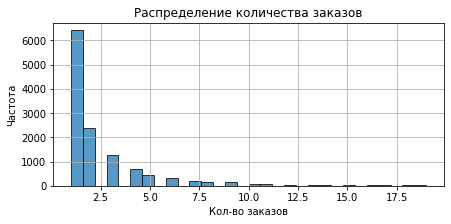

In [88]:
cleaned_device_users = device_users[device_users['order_id'] <= device_users['order_id'].quantile(0.99)]['order_id']

plt.figure(figsize=(7, 3))

# Строим гистограмму с помощью pandas через plot(kind='hist')
cleaned_device_users.plot(
                kind='hist', # Тип графика - гистограмма
                bins=30, # Устанавливаем количество корзин
                alpha=0.75,
                edgecolor='black',
)

# Настраиваем оформление графика
plt.title('Распределение количества заказов')
plt.xlabel('Кол-во заказов')
plt.ylabel('Частота')
# Добавляем сетку графика
plt.grid()

# Выводим график
plt.show() 

In [89]:
# Обновим столбец в исходной таблице
before_row_count = device_users.shape[0]
print(f'Количество строк до удаления выбросов: {before_row_count}')

device_users = device_users[device_users['order_id'] <= device_users['order_id'].quantile(0.99)]

after_row_count = device_users.shape[0]
print(f'Количество строк после удаления выбросов: {after_row_count}')
print(f'Процент выбросов, который был удален: {round(100* (before_row_count - after_row_count) / before_row_count , 4)}%')

Количество строк до удаления выбросов: 12554
Количество строк после удаления выбросов: 12434
Процент выбросов, который был удален: 0.9559%


Удаленные выбросы составили около 1%, что не повлияет существенно на результаты анализа.

Проверим количество распределение уникальных пользователям по выборкам.

In [90]:
100 * device_users[device_users['device_type_canonical'] == 'mobile']['user_id'].nunique() / device_users['user_id'].nunique(), 100 * device_users[device_users['device_type_canonical'] == 'desktop']['user_id'].nunique() / device_users['user_id'].nunique() 

(87.05967508444587, 12.940324915554125)

Между группами наблюдается ощутимая разница в количестве уникальных пользователей.

##### 4.1.2 Проверка гипотезы

- Нулевая гипотеза H₀: Среднее количество заказов на одного пользователя мобильного приложения не различается по сравнению с пользователями стационарных устройств. μ(А) = μ(В)

- Альтернативная гипотеза H₁: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств. μ(B) < μ(A)

**Для проверки гипотезы будет использованы Т-тест Уэлча и тест Манна-Уитни, поскольку:**

* распределение имеет тяжелые хвосты, значительные выбросы. T-тест в качестве условия требует нормального распределения выборочного среднего, то есть у распределения не должно быть тяжёлых хвостов и выбросов. У теста Манна — Уитни таких требований нет, и он нечувствителен к выбросам из-за рангового преобразования.
* оба теста позволяют не проверять равенство выборочных дисперсий. В результате анализа распределения количества уникальных пользователей установлено, что распределение между группами неравномерное. Применение данного теста позволит учесть данные факторы.

Чтобы избежать ошибок второго рода, часто используют оба теста при анализе результатов эксперимента. В большинстве случаев тесты покажут одинаковый результат с точки зрения принятия или отвержения нулевой гипотезы. Однако для надёжности совершим эту проверку, чтобы исключить вероятность влияния выбросов на результат t-теста.

Уровень значимости выбран в размере 0,05, поскольку подобного рода проверки не требуют значительной точности.

In [91]:
metric_a = device_users[device_users['device_type_canonical'] == 'mobile']['order_id'] ## выборка целевой метрики для группы A
metric_b = device_users[device_users['device_type_canonical'] == 'desktop']['order_id'] ## выборка целевой метрики для группы B

alpha = 0.05 ## на каком уровне значимости проверяем гипотезу о равенстве выборочных средних
stat_welch_ttest, p_value_welch_ttest = ttest_ind(
    metric_a, 
    metric_b, 
    equal_var=False,
    alternative='greater' ## поскольку альтернативная гипотеза о том, что выборочное среднее первой выборки (metric_a) больше второй выборки
) ## применяем t-тест Уэлча

if p_value_welch_ttest>alpha:
    print(f'p-value теста Уэлча ={round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза находит подтверждение! Выборочные средние в группах A и B равны')
    print('Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения не различается по сравнению с пользователями стационарных устройств')
else:
    print(f'p-value теста Уэлча ={round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза не находит подтверждения! Выборочные средние в группах A и B не равны, и в группе В больше')
    print('Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств')

p-value теста Уэлча =0.0
Нулевая гипотеза не находит подтверждения! Выборочные средние в группах A и B не равны, и в группе В больше
Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств


In [92]:
from scipy.stats import mannwhitneyu

mw_test = mannwhitneyu(
    metric_a, # Выборка значений метрики для группы А
    metric_b, # Выборка значений метрики для группы B
    alternative='greater'
)
if mw_test.pvalue > alpha:
    print(f'pvalue={mw_test.pvalue} > {alpha}')
    print('Нулевая гипотеза находит подтверждение! Распределения метрики в группах A и B равны')
    print('Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения не различается по сравнению с пользователями стационарных устройств')
else:
    print(f'pvalue={mw_test.pvalue} < {alpha}')
    print('Нулевая гипотеза не находит подтверждения! Распределения в группах A и B не равны, и в группе В больше')
    print('Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств')

pvalue=3.340154514429036e-38 < 0.05
Нулевая гипотеза не находит подтверждения! Распределения в группах A и B не равны, и в группе В больше
Интерпретация: Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств


##### 4.1.3 Выводы

В результате проведенного статистического теста установлено:
* распределение имеет тяжелые хвосты в правой части. Были удалены выбросы по 99-процентилю, в результате которого удалено около 1% данных из анализируемого среза.
* распределение между группами неравномерное. Группа А (мобильные устройства) составляет около 87%, группа В составляет 13%.
* на основании анализа выборки было принято решение использовать t-тест Уэлча и тест Манна-Уитни для проведения стат теста.
* уровень значимости принят на уровне 0,05.
* в результате проведенного теста p-value составил < 0,05, что означает о непринятии нулевой гипотезы.
* Таким образом, среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств

#### 4.2 Проверка гипотезы о среднем времени между заказами пользователей различных мобильных устройств

##### 4.2.1 Проверка дизайна теста

In [93]:
# уберем строки с заглушками
df_sort = df_autumn.loc[~(df_autumn['days_since_prev'] == -1)]

# произведем расчет ключевой метрики по группам
device_days = df_sort.groupby('device_type_canonical')['days_since_prev'].mean().round(3)
device_days

device_type_canonical
desktop    3.027
mobile     3.778
Name: days_since_prev, dtype: float64

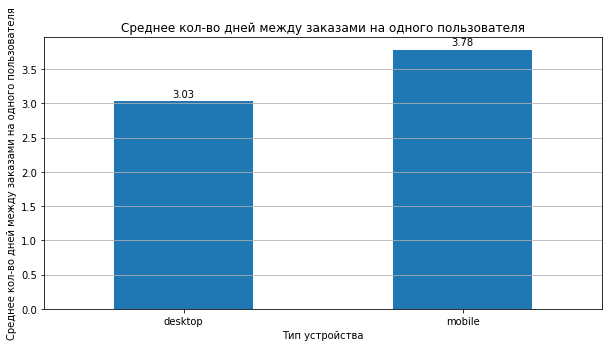

In [94]:
# Построим график столбчатой диаграммы
device_days.plot(kind='bar',
               title='Среднее кол-во дней между заказами на одного пользователя',
               legend=False,
               ylabel='Среднее кол-во дней между заказами на одного пользователя',
               xlabel='Тип устройства',
               rot=0,
               figsize=(10,5))
plt.grid(axis='y')
ax = plt.gca()
autolabel(ax.patches, height_factor=1.01)

# Выводим график
plt.show()

Среднее количество дней между заказами на одного пользователя, совершающего заказ с мобильных устройств, составляет 3,78 дня, с декстопных устройств 3,03.

In [95]:
# осуществим срез по выборкам с расчетов показателя по пользователям
device_users_days = df_sort.groupby(['device_type_canonical', 'user_id'])['days_since_prev'].mean().reset_index()
device_users_days

,device_type_canonical,user_id,days_since_prev
0,desktop,002b75ca606ba46,4.666667
1,desktop,002ec276eee9b0b,10.000000
2,desktop,0040e12d70fae81,39.000000
3,desktop,005fefeabf1e678,0.000000
4,desktop,006d1660d830822,12.428571
5,desktop,009201290d7316b,9.000000
6,desktop,00937de412ea430,0.333333
7,desktop,00ab1d21393d532,71.000000
8,desktop,00ca94ffb2a68b5,5.000000
9,desktop,00cb8c1ef996876,1.000000


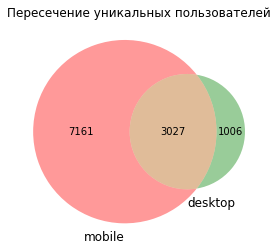

In [96]:
# Определим уникальные значения пользователей
A_id = set(device_users_days['user_id'].loc[device_users_days.device_type_canonical == 'mobile'].dropna().unique())
B_id = set(device_users_days['user_id'].loc[device_users_days.device_type_canonical == 'desktop'].dropna().unique())

# Строим диаграмму Венна
venn2([A_id, B_id], set_labels=('mobile', 'desktop'))
# Отображаем график
plt.title("Пересечение уникальных пользователей")
plt.show()

Пользователи в обоих выборках не должны пересекаться для проведения статистических тестов, поэтому удалим пересекающихся уникальных пользователей.

In [97]:
# Удалим дублирующиеся строки
device_users_days = device_users_days.drop_duplicates(subset='user_id', keep=False)
device_users_days = device_users_days.reset_index(drop=True)
# Выводим информацию о датафрейме
device_users_days.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8167 entries, 0 to 8166
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   device_type_canonical  8167 non-null   object 
 1   user_id                8167 non-null   object 
 2   days_since_prev        8167 non-null   float64
dtypes: float64(1), object(2)
memory usage: 191.5+ KB


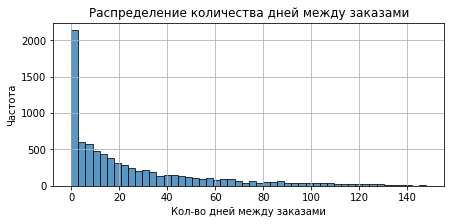

In [98]:
plt.figure(figsize=(7, 3))

# Строим гистограмму с помощью pandas через plot(kind='hist')
device_users_days['days_since_prev'].plot(
            kind='hist', # Тип графика — гистограмма
            bins=50, # Устанавливаем количество корзин
            alpha=0.75,
            edgecolor='black',
)

# Настраиваем оформление графика
plt.title('Распределение количества дней между заказами')
plt.xlabel('Кол-во дней между заказами')
plt.ylabel('Частота')

# Добавляем сетку графика
plt.grid()

# Выводим график
plt.show() 

В результате анализа гистограммы заметно, что распределение имеет тяжелые хвосты в правой части. Их значения по оси Y малы, значит, к существенному искажению они не приводят, и их можно удалить. Оставим значения, которые будут меньше 99%-го процентиля этого ряда значений или равны ему. Для вычислений используем метод quantile() из библиотеки pandas и построим распределение по набору значений, очищенному от выбросов.

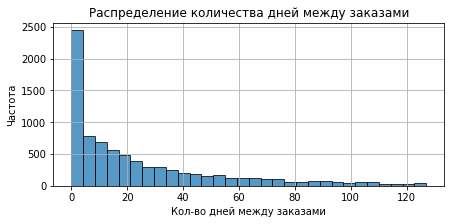

In [99]:
cleaned_device_users_days = device_users_days[device_users_days['days_since_prev'] <= device_users_days['days_since_prev'].quantile(0.99)]['days_since_prev']

plt.figure(figsize=(7, 3))

# Строим гистограмму с помощью pandas через plot(kind='hist')
cleaned_device_users_days.plot(
                kind='hist', # Тип графика - гистограмма
                bins=30, # Устанавливаем количество корзин
                alpha=0.75,
                edgecolor='black',
)

# Настраиваем оформление графика
plt.title('Распределение количества дней между заказами')
plt.xlabel('Кол-во дней между заказами')
plt.ylabel('Частота')
# Добавляем сетку графика
plt.grid()

# Выводим график
plt.show() 

In [100]:
# Обновим столбец в исходной таблице
before_row_count = device_users_days.shape[0]
print(f'Количество строк до удаления выбросов: {before_row_count}')

device_users_days = device_users_days[device_users_days['days_since_prev'] <= device_users_days['days_since_prev'].quantile(0.99)]

after_row_count = device_users_days.shape[0]
print(f'Количество строк после удаления выбросов: {after_row_count}')
print(f'Процент выбросов, который был удален: {round(100* (before_row_count - after_row_count) / before_row_count , 4)}%')

Количество строк до удаления выбросов: 8167
Количество строк после удаления выбросов: 8090
Процент выбросов, который был удален: 0.9428%


Проверим количество распределение уникальных пользователям по выборкам.

In [101]:
100 * device_users_days[device_users_days['device_type_canonical'] == 'mobile']['user_id'].nunique() / device_users_days['user_id'].nunique(), 100 * device_users_days[device_users_days['device_type_canonical'] == 'desktop']['user_id'].nunique() / device_users_days['user_id'].nunique() 

(87.76266996291719, 12.237330037082819)

Между группами наблюдается ощутимая разница в количестве уникальных пользователей.

##### 4.1.2 Проверка гипотезы

- Нулевая гипотеза H₀: Среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств. μ(А) = μ(В)

- Альтернативная гипотеза H₁: Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств. μ(B) < μ(A)

**Для проверки гипотезы будет использованы Т-тест Уэлча и тест Манна-Уитни, поскольку:**

* распределение имеет тяжелые хвосты, значительные выбросы. T-тест в качестве условия требует нормального распределения выборочного среднего, то есть у распределения не должно быть тяжёлых хвостов и выбросов. У теста Манна — Уитни таких требований нет, и он нечувствителен к выбросам из-за рангового преобразования.
* оба теста позволяют не проверять равенство выборочных дисперсий. В результате анализа распределения количества уникальных пользователей установлено, что распределение между группами неравномерное. Применение данного теста позволит учесть данные факторы.

Чтобы избежать ошибок второго рода, часто используют оба теста при анализе результатов эксперимента. В большинстве случаев тесты покажут одинаковый результат с точки зрения принятия или отвержения нулевой гипотезы. Однако для надёжности совершим эту проверку, чтобы исключить вероятность влияния выбросов на результат t-теста.

Уровень значимости выбран в размере 0,05, поскольку подобного рода проверки не требуют значительной точности.

In [102]:
metric_a = device_users_days[device_users_days['device_type_canonical'] == 'mobile']['days_since_prev'] ## выборка целевой метрики для группы A
metric_b = device_users_days[device_users_days['device_type_canonical'] == 'desktop']['days_since_prev'] ## выборка целевой метрики для группы B

alpha = 0.05 ## на каком уровне значимости проверяем гипотезу о равенстве выборочных средних
stat_welch_ttest, p_value_welch_ttest = ttest_ind(
    metric_a, 
    metric_b, 
    equal_var=False,
    alternative='greater' ## поскольку альтернативная гипотеза о том, что выборочное среднее первой выборки (metric_a) больше второй выборки
) ## применяем t-тест Уэлча

if p_value_welch_ttest>alpha:
    print(f'p-value теста Уэлча ={round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза находит подтверждение! Выборочные средние в группах A и B равны')
    print('Интерпретация: Среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств')
else:
    print(f'p-value теста Уэлча ={round(p_value_welch_ttest, 2)}')
    print('Нулевая гипотеза не находит подтверждения! Выборочные средние в группах A и B не равны, и в группе В больше')
    print('Интерпретация: Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств')

p-value теста Уэлча =1.0
Нулевая гипотеза находит подтверждение! Выборочные средние в группах A и B равны
Интерпретация: Среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств


In [103]:

mw_test = mannwhitneyu(
    metric_a, # Выборка значений метрики для группы А
    metric_b, # Выборка значений метрики для группы B
    alternative='greater'
)
if mw_test.pvalue > alpha:
    print(f'pvalue={mw_test.pvalue} > {alpha}')
    print('Нулевая гипотеза находит подтверждение! Распределения метрики в группах A и B равны')
    print('Интерпретация: Среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств')
else:
    print(f'pvalue={mw_test.pvalue} < {alpha}')
    print('Нулевая гипотеза не находит подтверждения! Распределения в группах A и B не равны, и в группе В больше')
    print('Интерпретация: Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств')

pvalue=0.4611807855201524 > 0.05
Нулевая гипотеза находит подтверждение! Распределения метрики в группах A и B равны
Интерпретация: Среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств


##### 4.2.3 Выводы

В результате проведенного статистического теста установлено:
* распределение имеет тяжелые хвосты в правой части. Были удалены выбросы по 99-процентилю, в результате которого удалено около 1% данных из анализируемого среза.
* распределение между группами неравномерное. Группа А (мобильные устройства) составляет около 88%, группа В составляет 12%.
* на основании анализа выборки было принято решение использовать t-тест Уэлча и тест Манна-Уитнки для проведения стат теста.
* уровень значимости принят на уровне 0,05.
* в результате проведенного теста p-value составил > 0.05, что означает о принятии нулевой гипотезы.
* Таким образом, среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств

### Шаг 5. Итоги и выводы

<!--  -->
<div style="background-color: white; border: 2px solid black; border-radius: 20px; padding: 15px 25px; display: inline-block; color: black;">
    
🏁 **Загрузка данных и предобработка**
---
    
    В рамках данного проекта были анализированы 3 датасета: order_df, events_df и tenge_df, первые два датасета были объединены в один датафрейм df для удобства предобработки и для исследовательского анализа.
    В результате предобработки датафрейма df были удалены неявные дубликаты, явные дубликаты отсутствовали. Также была проведена проверка категориальных и количественных данных. Несоответствия в категориальных данных не выявлены, влияющие на результаты исследовательского анализа. В результате анализа выбросов по столбцам renevue и tickets_count были выявлены выбросы в правом хвосте, которые были удалены по 99-процентилю. На этапе предобработки было удалено всего 1,05% строк от общего датафрейма df, что является несущественным в рамках общего объема информации.
    Также на этапе предобработки были сменены типы данных по столбцам created_dt_msk и created_ts_msk на тип данных data. По прочим столбцам с количественными данными была понижена разрядность для увеличения производительности работы.
    В датафрейме df были созданы столбцы `revenue_rub`, `one_ticket_revenue_rub`, `month`, `season`, необходимые для исследовательского анализа. Произведена замена тип данных по новым столбцам: понижена разрядность по столбцам revenue_rub, one_ticket_revenue_rub, month для ускорения производительности (без изменения типа).
    Датафрейм tenge_df также был проанализирован на наличие пропусков, дубликатов, которые не были выявлены. Данные в столбцах датафрейма соответствуют содержанию, данных достаточно для конвертации валюты в основном датафрейме. По столбцам с количественными данными была понижена разрядность для увеличения производительности работы.
    
---
🏁 **Ислледовательский анализ**
---

    В ходе анализа динамики количества заказов в летний и осенний период выявлено, что в осенний период возрастает количество заказов. 
    В осенний период наиболее популярными мероприятиями являются концерты, театры и другие, в летний период данные мероприятия также является популярными. Также стоит отметить, что с появлением осеннего сезона возрастает спрос на спортивные мероприятия, театры и елки, снижается спрос на выставки, стендап, концерты и другое. В разрезе типов устройств есть небольшие различия в перераспределении заказов по устройствам, однако их доля меняется менее чем на 1 %.
    Согласно распределению заказов по категориям возрастных ограничений в разрезе периодов, замечено в осенний период возрастает спрос на мероприятия 0+, 12+. По прочим категориям встречается некоторые снижения спроса на мероприятия.
    За весь рассматриваемый период наблюдается планомерный рост выручки по мероприятиям стендап и выставки. Также анализ среднего чека (средняя выручка за билет) показал рост по типам стендап, выставки. 
    Пользовательская активность среди недели замечена во вторник с повышением уровня количества заказов. В четверг наблюдается рост количества пользователей. В выходные дни активность пользователей падает.
    Были проанализированы популярные регионы и площадки. Стоит отметить Каменевский регион, Североярская область, которые занимают 1 и 2 места по уровню разнообразия мероприятий и количества заказов. Третье место делят Широковская область (по уровню разнообразия мепроприятий) и Медовская область (по количеству заказов). 
    По площадкам нет определенной стабильности в разнообразии, количестве заказов и объему выручки. Наиболее "разнообразным" по мероприятиям является Дворец культуры "Скворечник" Инк и  Фестивальный проект "Листья" Групп. По количеству заказов популярной считается площадка Студия дизайна "Платформа" Инкорпорэйтед, по суммарной выручке Студия дизайна "Лестница" Лимитед.
    
---
🏁 **Статистический тест**
---
    
    В рамках данного раздела проведен статический тест по двум гипотезам:
    1. Среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств.
    2. Среднее время между заказами пользователей мобильных приложений выше по сравнению с пользователями стационарных устройств.
  
    При подготовке к тестам была получена схожая картина по выборкам: тяжелые хвосты в правой части, неравномерное распределение пользователей по группам. Поэтому на основании анализа выборки было принято решение использовать t-тест Уэлча и тест Манна-Уитни для проведения стат теста. Уровень значимости принят на уровне 0,05 соответствующий необходимой точности. 
    В ходе первого проведенного теста о среднем количестве заказов по типам устройств было установлено, что среднее количество заказов на одного пользователя мобильного приложения выше по сравнению с пользователями стационарных устройств.
    В ходе второго проведенного теста о среднем времени между заказами пользователей по типам устройств было установлен, что среднее время между заказами мобильного приложения не различается по сравнению с пользователями стационарных устройств.
---

✅ 
    
    В разрезе возрастных групп, особого внимания требуют "детские" мероприятия (0+ лет), спрос осенью по ним в долевом соотношении возрастает быстрее, чем в прочих категориях.
    
    Анализ выручки и среднего чека по типам мероприятий показал, что выставки и стендап имеют рост в осенний период, однако, данные мероприятия не имеют высокого роста спроса в долевом соотношении по количеству заказов, поэтому стоит уделить данным мероприятиям особое внимание и стимулировать их спрос. При дальнейшем росте среднего чека и росте заказов, данные мероприятия могут увеличить общую выручку.
    
    Стоит проанализировать причины скачков пользовательской активности 03.09.2024 и 01.10.2024 г.
    
    Пользовательская активность с ростом количества заказов наблюдается во вторник (в разрезе дней недели), в выходные дни активность пользователей падает, однако, средний чек по ним выше.
    
    Необходимо обратить внимание на партнера - площадку Студия дизайна "Лестница" Лимитед, данная площадка приносит наибольшую выручку, однако, не имеет самого большого количества заказов. Увеличение заказов по данному партнеру может способствовать более быстрому приросту выручки.**
    
>**Таким образом, рекомендуется поддержка и стимулирование спроса по сегментам:**
    
>* "детские" мероприятия (категория 0+);
>* выставки и стендап;
>* площадка Студия дизайна "Лестница" Лимитед;
>* заказы выходного дня;
>* заказы с мобильных устройств
    
---